# PAI CA2

<b>Name: </b>Tan Wen Tao Bryan<br>
<b>Student ID: </b>2214449<br>

<b>Name: </b>Ryan Yeo<br>
<b>Student ID: </b>2214452<br>

<b>Name: </b>Zachary Leong Yao Jie<br>
<b>Student ID: </b>2201861<br>

<b>Name: </b>Ethan Pang Kin Fong<br>
<b>Student ID: </b>2214241<br>

-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

## CA1 Recap
- Succesfully imputed the missing values in the dataset and engineered new features in sensor dataset such as acceleration magnitude, gyro magnitude, pitch, roll, yaw, duration & distance.
- We have also preprocessed the data and removed extreme values in speed and seconds such as negative values or values that seems impossible to happen in the real world.
- Used KNNImputer on bookingID to impute missing values

### Importing Libraries

In [51]:
# Importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import dask.dataframe as dd
from dask.distributed import Client
from sklearn.utils import parallel_backend

import mlflow

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from category_encoders import BinaryEncoder
from sklearn.compose import ColumnTransformer
from imblearn.pipeline import Pipeline
from dask_ml.model_selection import train_test_split as dask_train_test_split

from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from xgboost import XGBClassifier
from sklearn.utils.class_weight import compute_class_weight

from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
from sklearn.svm import OneClassSVM
from sklearn.covariance import EllipticEnvelope

from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from lightgbm import LGBMClassifier

import joblib
import pickle

# import dimension reduction techniques
from sklearn.decomposition import PCA

#sklearn model evaluation
from sklearn.model_selection import(
    cross_validate, GridSearchCV, RandomizedSearchCV, learning_curve, StratifiedKFold
)
from sklearn.metrics import confusion_matrix, RocCurveDisplay, make_scorer, fbeta_score, classification_report
from sklearn.metrics import balanced_accuracy_score, roc_auc_score, roc_curve, precision_recall_curve, average_precision_score


import warnings
warnings.filterwarnings('ignore')

In [13]:
# Importing datasets
cab_driver_df = pd.read_hdf(f"./Datasets/cab_driver.h5", key='cab_driver', chunksize=10_000)
sensor_safety_df = pd.read_hdf(f"./Datasets/sensor_safety.h5", key='safety_labels', chunksize=10_000)

cab_driver_df_cc = pd.concat(cab_driver_df, ignore_index=True)
sensor_safety_df_cc = pd.concat(sensor_safety_df, ignore_index=True)

# Read the datasets
print(len(cab_driver_df_cc))
print(len(sensor_safety_df_cc))


500
7126686


In [14]:
# Check columns and type of values in each column
print("Driver Dataset")
for col in cab_driver_df_cc.columns:
    print(f"{col} - {cab_driver_df_cc[col].dtype}")

print("\nSafety + Sensors Dataset")
for col in sensor_safety_df_cc.columns:
    print(f"{col} - {sensor_safety_df_cc[col].dtype}")

Driver Dataset
driver_id - int16
driver_name - object
date_of_birth - datetime64[ns]
num_of_years_driving_exp - int16
gender - category
car_brand - category
car_model_year - int16
driver_rating - float16
driver_age - int64
car_age - int16

Safety + Sensors Dataset
sensor_id - int32
booking_id - int64
accuracy - float32
bearing - float32
acceleration_x - float32
acceleration_y - float32
acceleration_z - float32
gyro_x - float32
gyro_y - float32
gyro_z - float32
second - float64
speed - float64
driver_id - int16
label - int16
acceleration_magnitude - float64
gyro_magnitude - float32
pitch - float32
roll - float32
yaw - float32
duration - float64
distance - float64


**Observations**
- Drivers dataset:
    - Drivers ID is a unique value which should be removed from the dataset
    - Categorical variables that should be encoded using one hot encoding: Gender, Car Brand
    - Can remove drivers name from the dataset
    - Date of Birth, Car Model Year can be removed as driver age & car age can be used as the substitutes
    - Rest of the variables are numerical so we just need to scale them
<br>
- Safety + Sensors dataset: (Main focus for data processing and machine learning)
    - Target variable that is used for the classification project is label
    - Rest of the features are numerical so we just need to scale them
    - Can merge on drivers' id to combine the dataset into 1

In [15]:
# Check for missing values
print("\nMissing Values")

cab_driver_df_missing = 0
sensor_safety_df_missing = 0
for chunk in pd.read_hdf(f"./Datasets/cab_driver.h5", key='cab_driver', chunksize=10_000):
    missing_values = chunk.isnull().sum().sum()
    cab_driver_df_missing += missing_values

print()

for chunk in pd.read_hdf(f"./Datasets/sensor_safety.h5", key='safety_labels', chunksize=10_000):
    missing_values = chunk.isnull().sum().sum()
    sensor_safety_df_missing += missing_values

print(f"Driver Dataset - {cab_driver_df_missing}")
print(f"Safety + Sensors Dataset - {sensor_safety_df_missing}")


Missing Values



Driver Dataset - 0
Safety + Sensors Dataset - 0


**Observations:**
- No missing values in the dataset.

## Advanced Data Preprocessing

### Drop unwanted columns
- Drop sensor_id as it is a unique value every column

In [16]:
# Make a copy of the original sensor_safety_df_cc dataframe
sensor_safety_ori_df = sensor_safety_df_cc.copy()

sensor_safety_df_cc.drop(["sensor_id"], axis=1, inplace=True)
display(sensor_safety_df_cc.head())

,booking_id,accuracy,bearing,acceleration_x,acceleration_y,acceleration_z,gyro_x,gyro_y,gyro_z,second,speed,driver_id,label,acceleration_magnitude,gyro_magnitude,pitch,roll,yaw,duration,distance
0,1348619731067,4.000,2.846444,-1.168475,-9.913498,-1.903744,0.071355,0.120739,0.028943,0.0,35.178078,442,0,10.162038,0.143203,-1.349175,-0.115239,-0.188452,282.0,2.755616
1,1305670058088,4.551,179.000000,1.767822,9.211441,2.033432,0.090790,-0.000916,-0.016373,0.0,48.456000,57,0,9.597431,0.092259,1.286224,0.185255,0.213491,1333.0,17.942180
2,8589934600,3.209,330.000000,1.168370,-0.259213,2.366668,-0.003665,-0.004887,0.010996,0.0,8.493149,456,1,2.652056,0.012578,-0.097897,0.456214,1.102614,1886.0,4.449466
3,498216206436,16.000,260.999878,0.316568,-9.729868,0.893329,-0.014891,0.006484,0.002129,0.0,9.377673,394,0,9.775918,0.016380,-1.473695,0.032388,0.091508,611.0,1.591600
4,25769803861,3.856,69.000000,-0.108000,9.392000,-0.906000,0.007401,-0.015167,0.024612,0.0,9.144555,75,1,9.436216,0.029843,1.473952,-0.011446,-0.096161,883.0,2.242956


### Feature Engineering
- Add on to the previous features we have already engineered in CA1

#### Rate of Unsafe Trips
- Group by booking ID, and group by driver ID and calculate the mean of the labels to show percentage of labels that are value of 1

In [17]:
# Rate of Unsafe Trips
# Group by booking id and get the mean of the label and the first value of the driver id
grouped_booking = sensor_safety_ori_df.groupby("booking_id").agg({"label": "first", "driver_id": "first"})
# Then group by driver id and get the mean of the label
rate_unsafe_trips = grouped_booking.groupby("driver_id").agg({"label": "mean"})

# Rename the column label in created dataframe to rate_unsafe_trips
rate_unsafe_trips.rename(columns={"label": "rate_of_unsafe_trips"}, inplace=True)

# Concatenate the two dataframes together
sensor_safety_df_cc = pd.merge(sensor_safety_df_cc, rate_unsafe_trips, on='driver_id', how='inner')
sensor_safety_df_cc.head()

,booking_id,accuracy,bearing,acceleration_x,acceleration_y,acceleration_z,gyro_x,gyro_y,gyro_z,second,...,driver_id,label,acceleration_magnitude,gyro_magnitude,pitch,roll,yaw,duration,distance,rate_of_unsafe_trips
0,1348619731067,4.0,2.846444,-1.168475,-9.913498,-1.903744,0.071355,0.120739,0.028943,0.0,...,442,0,10.162038,0.143203,-1.349175,-0.115239,-0.188452,282.0,2.755616,0.352941
1,987842478120,3.0,165.000000,0.755620,9.865289,0.756683,0.000262,0.000471,-0.000593,0.0,...,442,0,9.923077,0.000802,1.462822,0.076222,0.076329,869.0,0.000000,0.352941
2,627065225239,6.0,213.463303,0.253314,-6.567627,-6.333603,0.010191,0.237171,0.174464,0.0,...,442,0,9.127564,0.294604,-0.803137,0.027756,-0.766889,1692.0,8.395841,0.352941
3,1666447310849,3.0,0.000000,0.686903,9.350990,-3.014734,-0.000925,0.005722,-0.006621,0.0,...,442,1,9.848933,0.008800,1.251454,0.069801,-0.311091,536.0,0.000000,0.352941
4,1571958030450,3.0,13.000000,1.441353,9.481328,1.822043,-0.049166,0.015333,0.011481,0.0,...,442,0,9.761809,0.052766,1.330500,0.148194,0.187751,598.0,0.000000,0.352941


#### G-Force
- Acceleration due to gravity

$$ \text{G Force} = \text{Acceleration} \div 9.8 $$

In [18]:
# Engineer new feature, G-Force, which is accleration divided by 9.8
sensor_safety_df_cc["g_force"] = sensor_safety_df_cc["acceleration_magnitude"] / 9.8
sensor_safety_df_cc.head()

,booking_id,accuracy,bearing,acceleration_x,acceleration_y,acceleration_z,gyro_x,gyro_y,gyro_z,second,...,label,acceleration_magnitude,gyro_magnitude,pitch,roll,yaw,duration,distance,rate_of_unsafe_trips,g_force
0,1348619731067,4.0,2.846444,-1.168475,-9.913498,-1.903744,0.071355,0.120739,0.028943,0.0,...,0,10.162038,0.143203,-1.349175,-0.115239,-0.188452,282.0,2.755616,0.352941,1.036943
1,987842478120,3.0,165.000000,0.755620,9.865289,0.756683,0.000262,0.000471,-0.000593,0.0,...,0,9.923077,0.000802,1.462822,0.076222,0.076329,869.0,0.000000,0.352941,1.012559
2,627065225239,6.0,213.463303,0.253314,-6.567627,-6.333603,0.010191,0.237171,0.174464,0.0,...,0,9.127564,0.294604,-0.803137,0.027756,-0.766889,1692.0,8.395841,0.352941,0.931384
3,1666447310849,3.0,0.000000,0.686903,9.350990,-3.014734,-0.000925,0.005722,-0.006621,0.0,...,1,9.848933,0.008800,1.251454,0.069801,-0.311091,536.0,0.000000,0.352941,1.004993
4,1571958030450,3.0,13.000000,1.441353,9.481328,1.822043,-0.049166,0.015333,0.011481,0.0,...,0,9.761809,0.052766,1.330500,0.148194,0.187751,598.0,0.000000,0.352941,0.996103


### Merging the Dataset
- Even though we are merging the dataset, we will not be fitting this data to the model for machine learning analysis

In [19]:
# Merge the two datasets together
merged_df = pd.merge(cab_driver_df_cc, sensor_safety_df_cc, on='driver_id', how='inner')
display(merged_df.head())
display(len(merged_df))

,driver_id,driver_name,date_of_birth,num_of_years_driving_exp,gender,car_brand,car_model_year,driver_rating,driver_age,car_age,...,label,acceleration_magnitude,gyro_magnitude,pitch,roll,yaw,duration,distance,rate_of_unsafe_trips,g_force
0,1,Sinclair Birmingham,1982-10-17,10,Male,Audi,2010,3.800781,42,14,...,0,9.773461,0.539421,1.322672,0.224064,-0.104797,538.0,0.931956,0.292683,0.997292
1,1,Sinclair Birmingham,1982-10-17,10,Male,Audi,2010,3.800781,42,14,...,0,9.801221,0.030267,-1.233780,0.021697,-0.336262,313.0,1.069171,0.292683,1.000125
2,1,Sinclair Birmingham,1982-10-17,10,Male,Audi,2010,3.800781,42,14,...,1,9.892454,0.004261,1.092414,-0.042367,0.476185,418.0,0.000000,0.292683,1.009434
3,1,Sinclair Birmingham,1982-10-17,10,Male,Audi,2010,3.800781,42,14,...,1,9.971673,0.163006,-1.350811,-0.128480,-0.177571,1448.0,6.085479,0.292683,1.017518
4,1,Sinclair Birmingham,1982-10-17,10,Male,Audi,2010,3.800781,42,14,...,1,10.144902,0.161703,1.080951,-0.075947,0.482879,1325.0,0.000000,0.292683,1.035194


7126686

### Feature Selection
- Using feature importance to decide which features are meant to be kept as they are important to the model (more than coeff of 0.04)
- We will not use the drivers dataset due to a few reasons:
    - Information about the drivers are static => More booking trips by the same driver will result in heavy bias that will affect the model predictions
    - Not compatible with real-time data (car model, ratings, date_of_birth) used for GUI that is needed to obtain objective in user stories

#### Feature Importance
- We will be using DecisionTree so that we can use feature importance to show which features are important to the model.
- Do not need to normalise the values when using DecisionTree

In [20]:
merged_df.columns

Index(['driver_id', 'driver_name', 'date_of_birth', 'num_of_years_driving_exp',
       'gender', 'car_brand', 'car_model_year', 'driver_rating', 'driver_age',
       'car_age', 'booking_id', 'accuracy', 'bearing', 'acceleration_x',
       'acceleration_y', 'acceleration_z', 'gyro_x', 'gyro_y', 'gyro_z',
       'second', 'speed', 'label', 'acceleration_magnitude', 'gyro_magnitude',
       'pitch', 'roll', 'yaw', 'duration', 'distance', 'rate_of_unsafe_trips',
       'g_force'],
      dtype='object')

In [21]:
# Define the model with specific hyperparameters
model = DecisionTreeClassifier(random_state=42, criterion='gini', splitter='best', max_features=None, min_samples_split=2, min_samples_leaf=1, min_impurity_decrease=0.0, class_weight='balanced', max_depth=None)

# Temporary split of X and y
# Drop categorical columns and columns that rely on each trip (Will introduce bias and overfitting)
# Drop driver data like gender and car model
X = merged_df.drop(["label", "driver_id", "booking_id", "rate_of_unsafe_trips", "duration", 'driver_name', 'date_of_birth', 'num_of_years_driving_exp',
       'gender', 'car_brand', 'car_model_year', 'driver_rating', 'driver_age','car_age'], axis=1)
y = merged_df["label"]

# Fit the model
model.fit(X, y)

DecisionTreeClassifier(class_weight='balanced', random_state=42)

In [22]:
merged_df.columns

Index(['driver_id', 'driver_name', 'date_of_birth', 'num_of_years_driving_exp',
       'gender', 'car_brand', 'car_model_year', 'driver_rating', 'driver_age',
       'car_age', 'booking_id', 'accuracy', 'bearing', 'acceleration_x',
       'acceleration_y', 'acceleration_z', 'gyro_x', 'gyro_y', 'gyro_z',
       'second', 'speed', 'label', 'acceleration_magnitude', 'gyro_magnitude',
       'pitch', 'roll', 'yaw', 'duration', 'distance', 'rate_of_unsafe_trips',
       'g_force'],
      dtype='object')

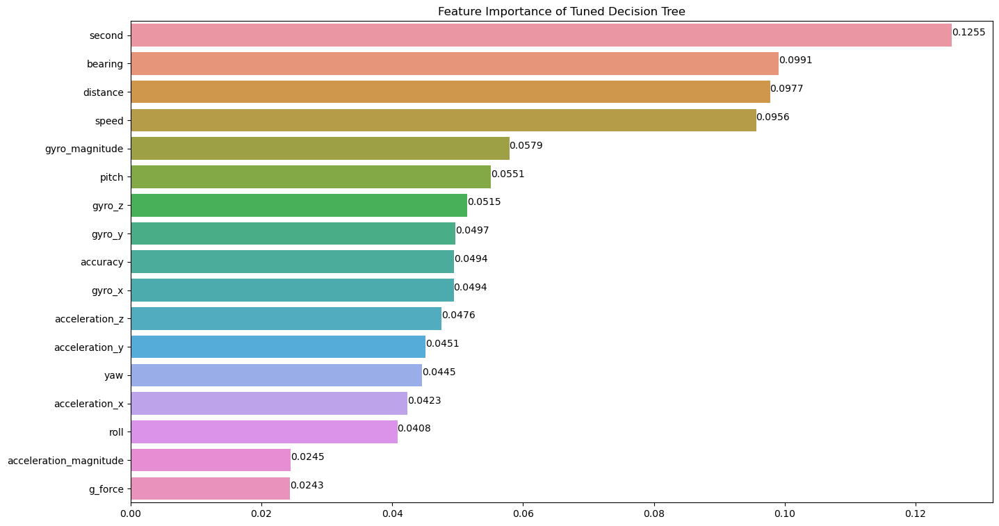

In [23]:
feature_names = ['accuracy', 'bearing', 'acceleration_x', 'acceleration_y', 'acceleration_z', 'gyro_x', 'gyro_y', 'gyro_z', 
                 'second', 'speed', 'acceleration_magnitude', 'gyro_magnitude','pitch', 'roll', 'yaw', 'distance', 'g_force']

# Create feature importance and sort the features based on the coefficient
importance = pd.Series(
model.feature_importances_, index=feature_names
).sort_values(ascending=False)
fig, ax = plt.subplots(figsize=(16, 9))
sns.barplot(
    x=importance.values, y=importance.index, ax=ax
)
ax.set_title("Feature Importance of Tuned {}".format("Decision Tree"))

for i, v in zip(np.arange(0, len(importance)), importance.values):
        ax.text(x=v, y=i, s=round(v, 4))

plt.show()

**Observations**
- As we can see, the features with extremely low correlation coefficient value < 0.04 are least important to the model I have chose hence I will drop these features (acceleration_magnitude, g_force)

In [24]:
# Drop the columns in the merged_df that are not important and may introduce bias and overfitting to the model
merged_df = merged_df.drop([
    "driver_id", "duration", 'driver_name', 'date_of_birth', 'num_of_years_driving_exp', 'gender', 'car_brand', 
    'car_model_year', 'driver_rating', 'driver_age','car_age', "acceleration_magnitude", "g_force", "rate_of_unsafe_trips"
], axis=1)

#### Aggregate Function
- Group the dataframe by bookingID and aggregate the data based on the mean value
- Significantly reduced the number of rows to approximately 20000

In [6]:
# Define the aggregation functions that be used to aggregate the data
agg_function = {
    "label": "first",
    "accuracy": "mean",
    "bearing": "mean",
    "acceleration_x": "mean",
    "acceleration_y": "mean",
    "acceleration_z": "mean",
    "gyro_x": "mean",
    "gyro_y": "mean",
    "gyro_z": "mean",
    "second": "last",
    "speed": "mean",
    "gyro_magnitude": "mean",
    "pitch": "mean",
    "roll": "mean", 
    "yaw": "mean",
    "distance": "mean"
}

# Aggregate the data by booking_id and get the mean of each feature
merged_df = merged_df.groupby("booking_id").agg(agg_function)
merged_df.head()

,booking_id,label,accuracy,bearing,acceleration_x,acceleration_y,acceleration_z,gyro_x,gyro_y,gyro_z,second,speed,gyro_magnitude,pitch,roll,yaw,distance
0,0,0,9.774505,177.875183,-0.678034,-9.172499,-1.502782,0.002265,-0.004102,-0.001695,932.049887,33.067248,0.100252,-1.300312,-0.072392,-0.160714,14.595516
1,1,1,3.745903,128.146774,-0.489893,9.267056,-2.155431,-0.000825,-0.004180,0.002366,577.547120,27.896658,0.068232,1.286173,-0.055284,-0.243772,8.012540
2,2,1,4.284037,176.775879,0.287461,9.638375,0.118502,-0.000568,-0.010772,0.004707,320.777778,10.266845,0.089715,1.433633,0.043428,0.015190,2.344263
3,4,1,9.911501,149.755768,-0.376058,-8.997721,-2.605016,-0.023275,0.023248,0.001746,542.644211,21.636000,0.110892,-1.234678,-0.038946,-0.278345,6.562920
4,6,0,4.660820,195.467468,0.555236,9.374181,2.291448,0.006699,-0.010974,0.001524,541.059524,16.953495,0.094485,1.290300,0.060687,0.245425,5.142560


In [26]:
# Reset the index of the dataframe
merged_df.reset_index(inplace=True)

In [5]:
# Latest columns & shape of the dataframe
print(merged_df.columns)
print(merged_df.shape)

Index(['booking_id', 'label', 'accuracy', 'bearing', 'acceleration_x',
       'acceleration_y', 'acceleration_z', 'gyro_x', 'gyro_y', 'gyro_z',
       'second', 'speed', 'gyro_magnitude', 'pitch', 'roll', 'yaw',
       'distance'],
      dtype='object')
(19972, 17)


**Observations**
- Number of rows have significantly reduced to 19972 rows

In [7]:
# Save the latest dataframe to a h5 file
merged_df.to_hdf(f"./Datasets/merged_df.h5", key='merged_df', mode='w', format='table')

In [2]:
# Read the latest dataframe from the h5 file
merged_df = pd.read_hdf(f"./Datasets/merged_df.h5", key='merged_df')

In [3]:
# Drop rate_of_unsafe_trips column
merged_df.drop("rate_of_unsafe_trips", axis=1, inplace=True)

In [4]:
merged_df.shape

(19972, 17)

## Outliers Analysis
- We will be analyzing the outliers through some of the available models

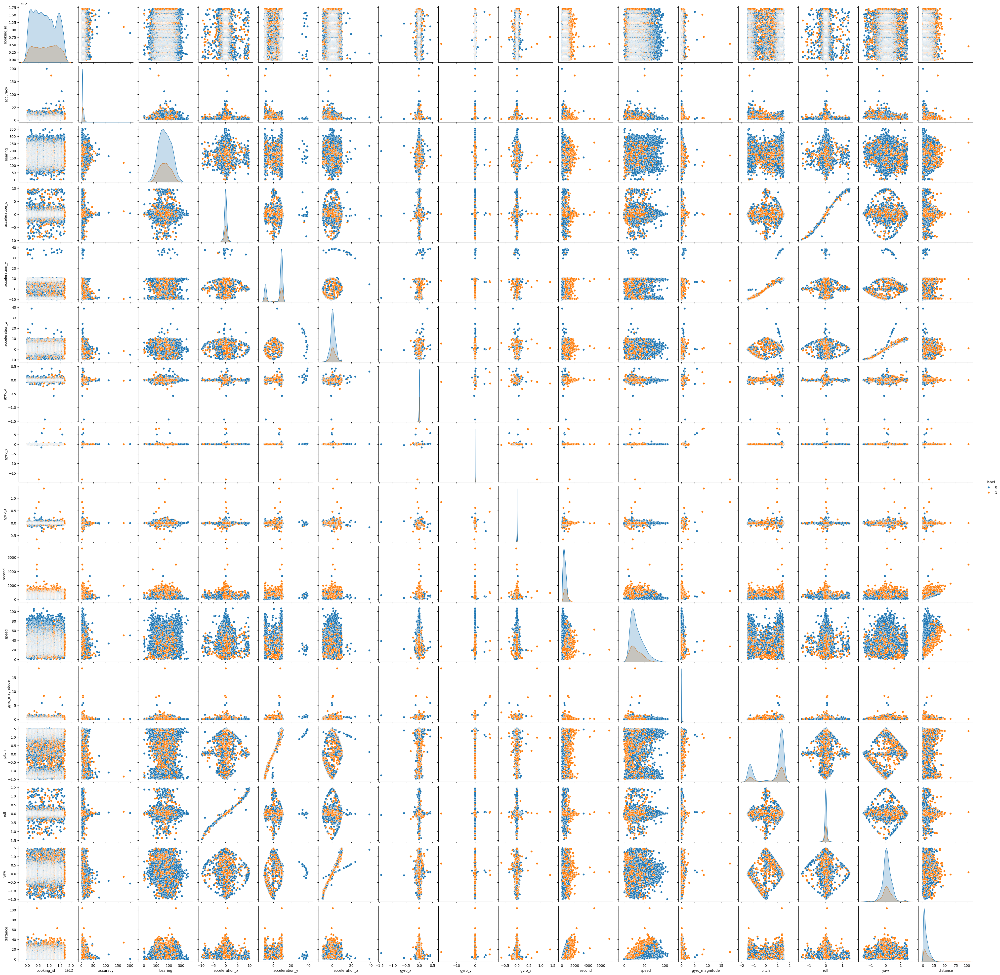

In [8]:
# Show a pairplot of the dataframe to reveal outliers
sns.pairplot(merged_df, hue="label")

**Observations**
- We see that there are a few outliers of the features that we could possibly handle.
- We can see that elliptical shape can be spotted in some of the features, hence we could use Elliptic Envelope to identify outliers

### Visualising Outliers
- **Anomaly Detection Methods**
    - One-Class SVM:
        - Finding a hyperplane that separates the majority of the data from the origin in the feature space and considers instances beyond the hyperplane as outliers
        - Useful when mostly normal instances exist in data and rare anomalies wants to be identified
    - Isolation Forest
        - Ensemble method that builds a collection of isolation trees
        - Works by randomly selecting a feature and a random value within the range of that feature to isolate an instance
        - Anomalies are expected to have shorter average path lengths in the trees
        - Effective for high dimensional data
    - Cluster-based LOF
        - Assigns a score to each instance based on the distance to the nearest cluster center and the density of its local neighbourhood within the cluster
        - Instances with low scores are considered as outliers
        - Suitable when anomalies are expected to be present in small clusters
    - Elliptic Envelope
        - Fits a robust covariance estimate to the data
        - Assumes normal instances are in Gaussian distribution and fits an ellipse around them, instances outside the ellipse are considered outliers
- Will use PCA to reduce the dimensionality of the feature to about 3 features in order to visualise the data in a graph

In [68]:
# Split data into X and y
X, y = merged_df.drop(["label", "booking_id"], axis = 1), merged_df["label"]

In [10]:
X.shape, y.shape

((19972, 15), (19972,))

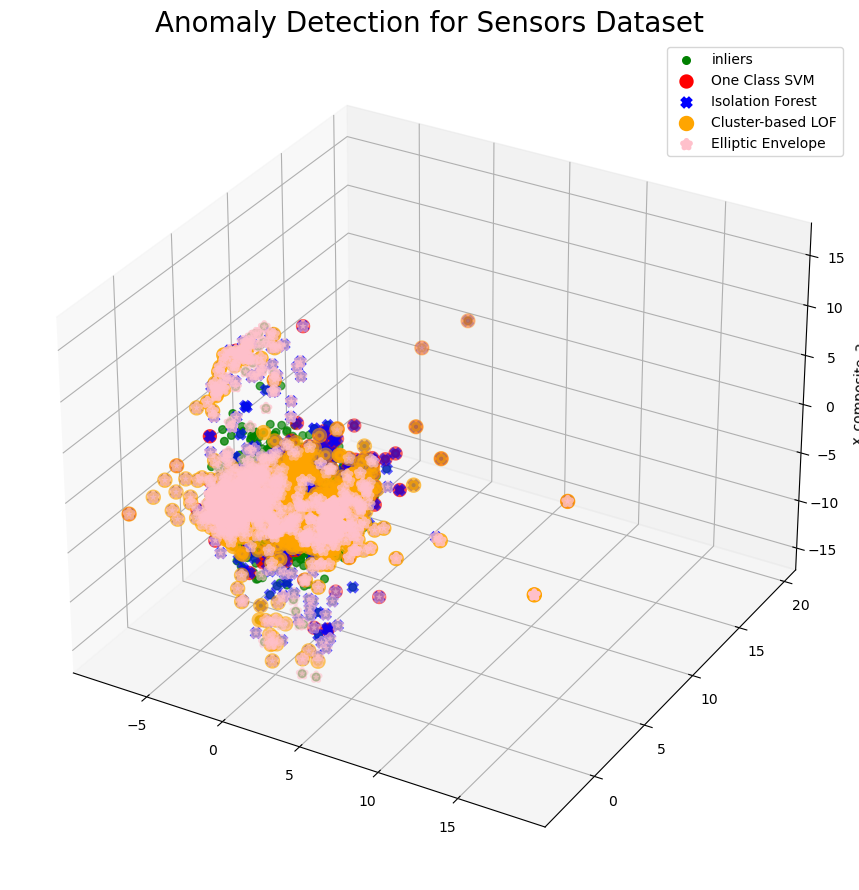

In [11]:
### Handle outliers
classifier_dict = {"One-Class SVM": OneClassSVM(nu=0.04),
                   "Isolation Forest": IsolationForest(contamination=0.04),
                   "Cluster-based LOF": LocalOutlierFactor(contamination=0.04),
                   "Elliptic Envelope": EllipticEnvelope(contamination=0.04)}

Outliers = pd.DataFrame()
for i, (clf_name, clf) in enumerate(classifier_dict.items()):
    clf.fit(X)
    X["anomaly"] = clf.fit_predict(X)
    outliers_subset = X[X.anomaly == -1]
    outliers_subset = outliers_subset.assign(model = clf_name)
    Outliers = pd.concat([Outliers, outliers_subset], axis=0, ignore_index=False)

pca = PCA(n_components=3) # reduce to k=3 dimensions
scaler = StandardScaler()
X_trans = scaler.fit_transform(X)
X_reduce = pca.fit_transform(X_trans)
fig = plt.figure(figsize=(11,9))
ax = fig.add_subplot(111, projection="3d")
ax.set_zlabel("x_composite_3")
ax.scatter(X_reduce[:, 0], X_reduce[:, 1], zs=X_reduce[:, 2], s=30, lw=1, label="inliers",c="green")
ax.scatter(X_reduce[Outliers[Outliers['model']=='One-Class SVM'].index, 0],
           X_reduce[Outliers[Outliers['model']=='One-Class SVM'].index, 1],
           X_reduce[Outliers[Outliers['model']=='One-Class SVM'].index, 2],
           lw=4, s=40, c="red", label="One Class SVM")
ax.scatter(X_reduce[Outliers[Outliers['model']=='Isolation Forest'].index, 0],
           X_reduce[Outliers[Outliers['model']=='Isolation Forest'].index, 1],
           X_reduce[Outliers[Outliers['model']=='Isolation Forest'].index, 2],
           lw=4, s=40, marker='x', c="blue", label="Isolation Forest")
ax.scatter(X_reduce[Outliers[Outliers['model']=='Cluster-based LOF'].index, 0],
           X_reduce[Outliers[Outliers['model']=='Cluster-based LOF'].index, 1],
           X_reduce[Outliers[Outliers['model']=='Cluster-based LOF'].index, 2],
           lw=4, s=50, c="orange", label="Cluster-based LOF")
ax.scatter(X_reduce[Outliers[Outliers['model']=='Elliptic Envelope'].index, 0],
           X_reduce[Outliers[Outliers['model']=='Elliptic Envelope'].index, 1],
           X_reduce[Outliers[Outliers['model']=='Elliptic Envelope'].index, 2],
           lw=4, s=30, marker="*", c="pink", label="Elliptic Envelope")
plt.title("Anomaly Detection for Sensors Dataset", fontsize=20)
plt.legend()
plt.tight_layout()

### Performance of Models Before Outlier Detection
- We will be using LogisticRegression & GradientBoosting to demonstrate which model is best for removing outliers
- We will just check if there is an improvement of the score after removing outliers
- Note that we are just checking if the models improved the scores without the machine learning feature engineering like scaling and handling unbalanced classes

In [13]:
# Inititate the dataframe to store the results before and after handling outliers for logisitic regression and gradient boosting
lr_results = pd.DataFrame(columns=["Mean Fit Time", "Mean F2", " Mean Recall", "Mean Precision", "Mean Balanced Accuracy", "Mean ROC-AUC"])
gb_results = pd.DataFrame(columns=["Mean Fit Time", "Mean F2", " Mean Recall", "Mean Precision", "Mean Balanced Accuracy", "Mean ROC-AUC"])

In [69]:
# Initialize client for parallel computing
client = Client()

f2 = make_scorer(fbeta_score, beta =2)
score_metrics={
    'f2': f2,
    "recall": "recall",
    "precision": "precision",
    "balanced_accuracy": "balanced_accuracy",
    "roc_auc_score":"roc_auc"
}

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# Logistic Regression
log_reg = LogisticRegression(random_state=42, max_iter = 50000)
with parallel_backend('dask'):
    log_reg.fit(X_train, y_train)
    y_pred_log_reg = log_reg.predict(X_test)

# Gradient Boosting
grad_boost = GradientBoostingClassifier(random_state=42, n_estimators=50)
with parallel_backend('dask'):
    grad_boost.fit(X_train, y_train)
    y_pred_grad_boost = grad_boost.predict(X_test)

# Cross validation results
log_reg_cv_results = cross_validate(log_reg, X_train, y_train, cv=5, scoring=score_metrics)
grad_boost_cv_results = cross_validate(grad_boost, X_train, y_train, cv=5, scoring=score_metrics)

# Return a dataframe that shows that mean score of all the cross validation results
results = pd.DataFrame([[log_reg_cv_results["fit_time"].mean(),log_reg_cv_results["test_f2"].mean(),log_reg_cv_results["test_recall"].mean(), log_reg_cv_results["test_precision"].mean(),
                        log_reg_cv_results["test_balanced_accuracy"].mean(), log_reg_cv_results["test_roc_auc_score"].mean()],
                        [grad_boost_cv_results["fit_time"].mean(),grad_boost_cv_results["test_f2"].mean(),grad_boost_cv_results["test_recall"].mean(), grad_boost_cv_results["test_precision"].mean(),
                        grad_boost_cv_results["test_balanced_accuracy"].mean(), grad_boost_cv_results["test_roc_auc_score"].mean()]],
                        columns=["Mean Fit Time", "Mean F2", " Mean Recall", "Mean Precision", "Mean Balanced Accuracy", "Mean ROC-AUC"], index=["Logistic Regression", "Gradient Boosting"])
display(round(results, 3))

,Mean Fit Time,Mean F2,Mean Recall,Mean Precision,Mean Balanced Accuracy,Mean ROC-AUC
Logistic Regression,0.350,0.239,0.206,0.666,0.586,0.715
Gradient Boosting,3.408,0.210,0.178,0.726,0.578,0.716


In [15]:
# Store the results in the respective dataframes
lr_results.loc["Before Handling Outliers"] = results.iloc[0]
gb_results.loc["Before Handling Outliers"] = results.iloc[1]

#### Confusion Matrix

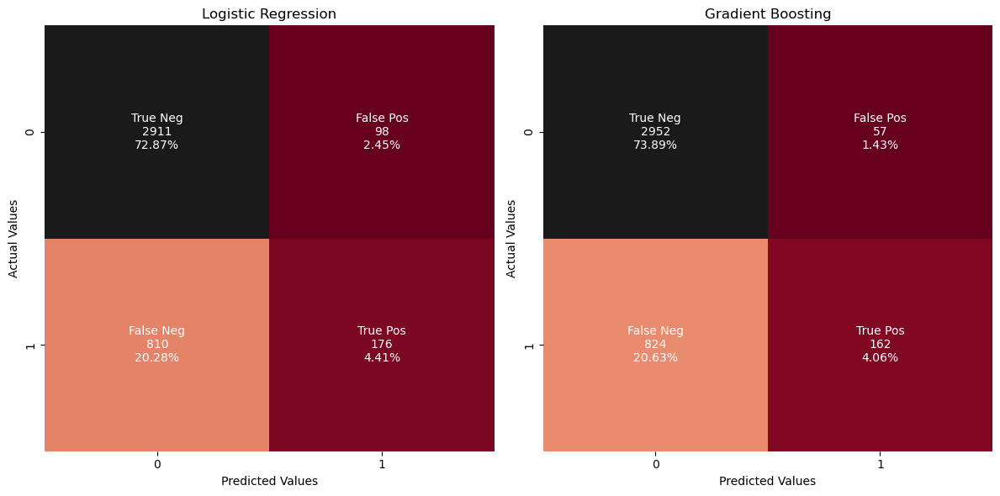

In [37]:
# Plot 2 heatmaps based on confusion matrices of the two models
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Logistic Regression
log_reg_cm = confusion_matrix(y_test, y_pred_log_reg)
log_reg_labels = ["True Neg","False Pos","False Neg","True Pos"]
log_reg_counts = ["{0:0.0f}".format(value) for value in log_reg_cm.flatten()]
log_reg_percentage = ["{0:.2%}".format(value) for value in log_reg_cm.flatten()/np.sum(log_reg_cm)]
log_reg_labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(log_reg_labels,log_reg_counts,log_reg_percentage)]
log_reg_labels = np.asarray(log_reg_labels).reshape(2,2)

sns.heatmap(confusion_matrix(y_test, y_pred_log_reg), annot=log_reg_labels, fmt="", ax=ax[0], cmap="RdGy", cbar=False)

# Gradient Boosting
grad_boost_cm = confusion_matrix(y_test, y_pred_grad_boost)
grad_boost_labels = ["True Neg","False Pos","False Neg","True Pos"]
grad_boost_counts = ["{0:0.0f}".format(value) for value in grad_boost_cm.flatten()]
grad_boost_percentage = ["{0:.2%}".format(value) for value in grad_boost_cm.flatten()/np.sum(grad_boost_cm)]
grad_boost_labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(grad_boost_labels,grad_boost_counts,grad_boost_percentage)]
grad_boost_labels = np.asarray(grad_boost_labels).reshape(2,2)

sns.heatmap(confusion_matrix(y_test, y_pred_grad_boost), annot=grad_boost_labels, fmt="", ax=ax[1], cmap="RdGy", cbar=False)

ax[0].set_title("Logistic Regression")
ax[0].set_ylabel("Actual Values")
ax[0].set_xlabel("Predicted Values")

ax[1].set_title("Gradient Boosting")
ax[1].set_ylabel("Actual Values")
ax[1].set_xlabel("Predicted Values")

plt.tight_layout()
plt.show()

**Observations**
- Notice how there are a greater number of true negative values compared to true positive values, we will need to handle that class imbalance at a later stage.
- For now, we do not have to handle imbalanced classes, as the main purpose is to remove outliers and the effectiveness is influenced by the characteristics of the data

#### ROC Curve

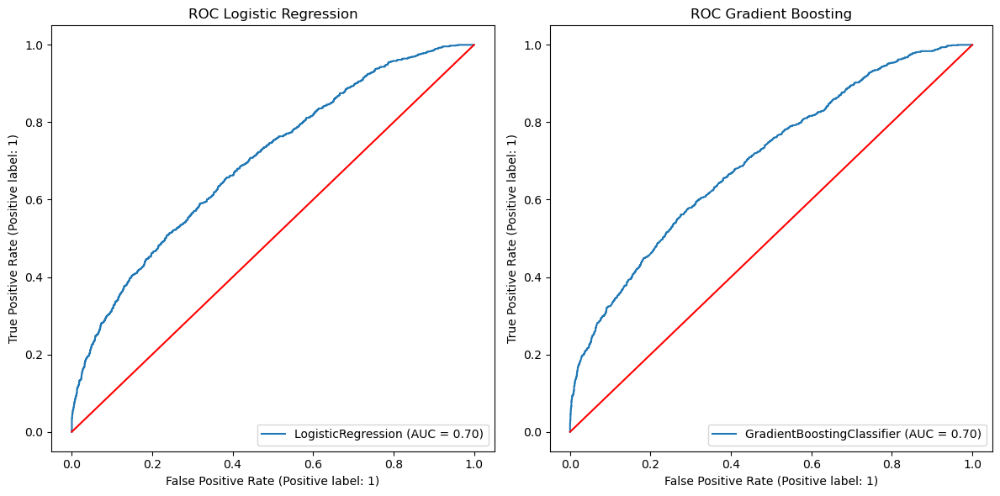

In [36]:
# Plot ROC curve
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Logistic Regression
log_reg_disp = RocCurveDisplay.from_estimator(log_reg, X_test, y_test, ax=ax[0])
x = np.linspace(0,1,2)
ax[0].plot(x,x,color="red")
ax[0].set_title("ROC Logistic Regression")

# Gradient Boosting
grad_boost_disp = RocCurveDisplay.from_estimator(grad_boost, X_test, y_test, ax=ax[1])
x = np.linspace(0,1,2)
ax[1].plot(x,x,color="red")
ax[1].set_title("ROC Gradient Boosting")

plt.tight_layout()
plt.show()

#### Precision-Recall Curve

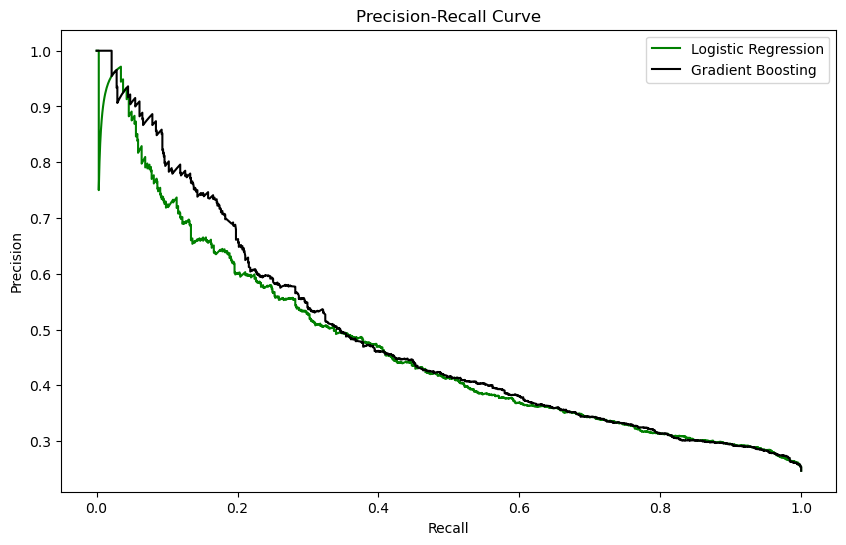

In [38]:
# Plot the precision-recall curve of two models on the same plot
fig, ax = plt.subplots(figsize=(10, 6))
log_precision, log_recall, _ = precision_recall_curve(y_test, log_reg.predict_proba(X_test)[:,1])
grad_precision, grad_recall, _ = precision_recall_curve(y_test, grad_boost.predict_proba(X_test)[:,1])

ax.plot(log_recall, log_precision, label="Logistic Regression", color="green")
ax.plot(grad_recall, grad_precision, label="Gradient Boosting", color="black")

ax.set_xlabel("Recall")
ax.set_ylabel("Precision")

ax.set_title("Precision-Recall Curve")
ax.legend()
plt.show()

**Observations**
- The precision-recall curve is decreasing which implies that as the threshold for classifying instances as positive is increasing, which proves an increase in precision but a decrease in recall.
- The sudden decrease in Logistic Regression in the PR-curve shows that it is a less efficient model compared to an ensemble model like Gradient Boosting, as it able to capture complex relationships in the data.

#### AUC-PR

In [70]:
# Print the AUC-PR score of the two models
print("Logistic Regression AUC-PR Score: ", average_precision_score(y_test, log_reg.predict_proba(X_test)[:,1]))
print("Gradient Boosting AUC-PR Score: ", average_precision_score(y_test, grad_boost.predict_proba(X_test)[:,1]))

Logistic Regression AUC-PR Score:  0.4687864084592738
Gradient Boosting AUC-PR Score:  0.4860723902744194


### One-Class SVM - Performance of Models After Outlier Detection

In [71]:
X, y = merged_df.drop(["label", "booking_id"], axis = 1), merged_df["label"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(X_train.shape)
print(y_train.shape)

(15977, 15)
(15977,)


In [72]:
svm = OneClassSVM(nu=0.04)
X_out = svm.fit_predict(X_train)
X_train, y_train = X_train[X_out == 1], y_train[X_out == 1]
print(X_train.shape)
print(y_train.shape)

(15337, 15)
(15337,)


**Observations**
- One-Class SVM detects about 640 data points as outliers

In [73]:
# Logistic Regression
log_reg = LogisticRegression(random_state=42, max_iter = 50000)
with parallel_backend('dask'):
    log_reg.fit(X_train, y_train)
    y_pred_log_reg = log_reg.predict(X_test)

# Gradient Boosting
grad_boost = GradientBoostingClassifier(random_state=42, n_estimators=50)
with parallel_backend('dask'):
    grad_boost.fit(X_train, y_train)
    y_pred_grad_boost = grad_boost.predict(X_test)

# Cross validation results
log_reg_cv_results = cross_validate(log_reg, X_train, y_train, cv=5, scoring=score_metrics)
grad_boost_cv_results = cross_validate(grad_boost, X_train, y_train, cv=5, scoring=score_metrics)

# Return a dataframe that shows that mean score of all the cross validation results
results = pd.DataFrame([[log_reg_cv_results["fit_time"].mean(),log_reg_cv_results["test_f2"].mean(),log_reg_cv_results["test_recall"].mean(), log_reg_cv_results["test_precision"].mean(),
                        log_reg_cv_results["test_balanced_accuracy"].mean(), log_reg_cv_results["test_roc_auc_score"].mean()],
                        [grad_boost_cv_results["fit_time"].mean(),grad_boost_cv_results["test_f2"].mean(),grad_boost_cv_results["test_recall"].mean(), grad_boost_cv_results["test_precision"].mean(),
                        grad_boost_cv_results["test_balanced_accuracy"].mean(), grad_boost_cv_results["test_roc_auc_score"].mean()]],
                        columns=["Mean Fit Time", "Mean F2", " Mean Recall", "Mean Precision", "Mean Balanced Accuracy", "Mean ROC-AUC"], index=["Logistic Regression", "Gradient Boosting"])
display(round(results, 3))

,Mean Fit Time,Mean F2,Mean Recall,Mean Precision,Mean Balanced Accuracy,Mean ROC-AUC
Logistic Regression,0.437,0.182,0.155,0.617,0.562,0.698
Gradient Boosting,3.282,0.148,0.124,0.680,0.552,0.698


**Observations**
- After removing the outliers with One-Class SVM, the scores worsen for both models based on every score metrics.

In [22]:
# Store the results in the respective dataframes
lr_results.loc["One-Class SVM"] = results.iloc[0]
gb_results.loc["One-Class SVM"] = results.iloc[1]

#### Confusion Matrix

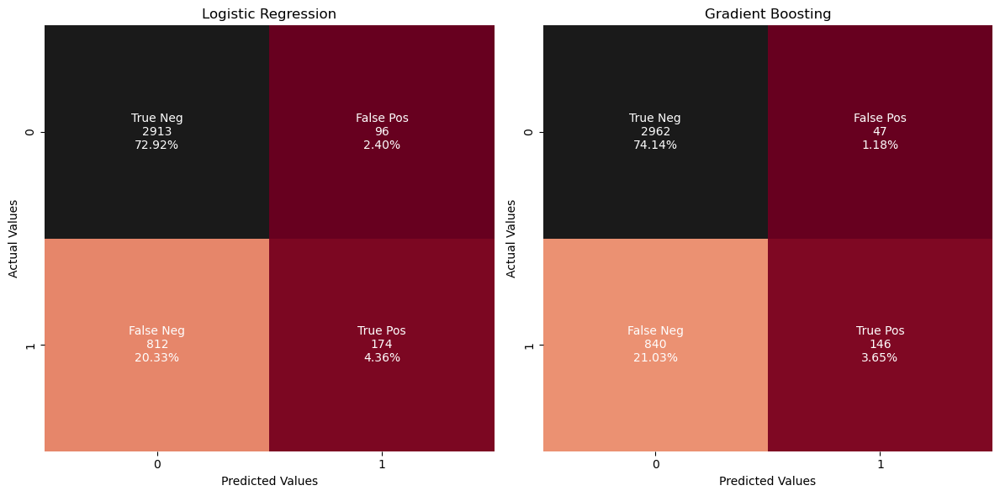

In [24]:
# Plot 2 heatmaps based on confusion matrices of the two models
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Logistic Regression
log_reg_cm = confusion_matrix(y_test, y_pred_log_reg)
log_reg_labels = ["True Neg","False Pos","False Neg","True Pos"]
log_reg_counts = ["{0:0.0f}".format(value) for value in log_reg_cm.flatten()]
log_reg_percentage = ["{0:.2%}".format(value) for value in log_reg_cm.flatten()/np.sum(log_reg_cm)]
log_reg_labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(log_reg_labels,log_reg_counts,log_reg_percentage)]
log_reg_labels = np.asarray(log_reg_labels).reshape(2,2)

sns.heatmap(confusion_matrix(y_test, y_pred_log_reg), annot=log_reg_labels, fmt="", ax=ax[0], cmap="RdGy", cbar=False)

# Gradient Boosting
grad_boost_cm = confusion_matrix(y_test, y_pred_grad_boost)
grad_boost_labels = ["True Neg","False Pos","False Neg","True Pos"]
grad_boost_counts = ["{0:0.0f}".format(value) for value in grad_boost_cm.flatten()]
grad_boost_percentage = ["{0:.2%}".format(value) for value in grad_boost_cm.flatten()/np.sum(grad_boost_cm)]
grad_boost_labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(grad_boost_labels,grad_boost_counts,grad_boost_percentage)]
grad_boost_labels = np.asarray(grad_boost_labels).reshape(2,2)

sns.heatmap(confusion_matrix(y_test, y_pred_grad_boost), annot=grad_boost_labels, fmt="", ax=ax[1], cmap="RdGy", cbar=False)

ax[0].set_title("Logistic Regression")
ax[0].set_ylabel("Actual Values")
ax[0].set_xlabel("Predicted Values")

ax[1].set_title("Gradient Boosting")
ax[1].set_ylabel("Actual Values")
ax[1].set_xlabel("Predicted Values")

plt.tight_layout()
plt.show()

**Observations**
- The values of True Positives decreased while the values of True Negatives increased for both models

#### ROC Curve

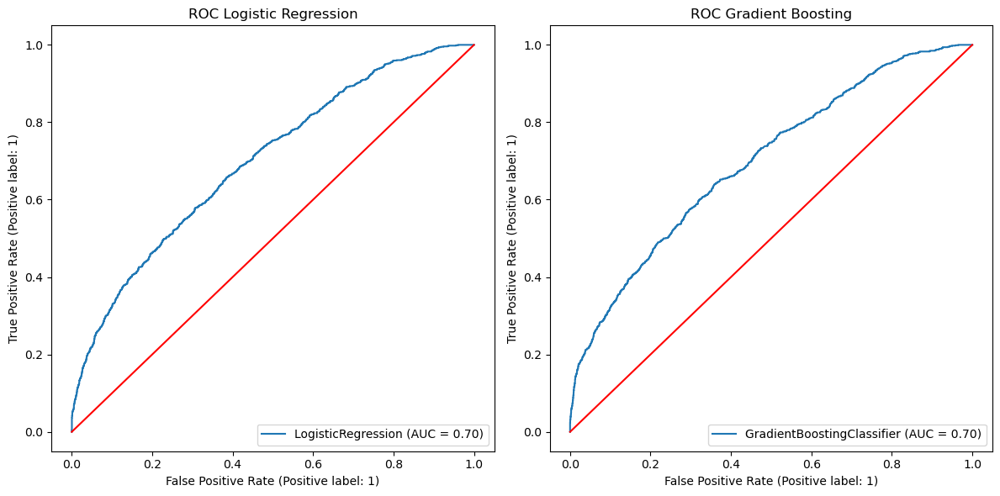

In [25]:
# Plot ROC curve
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Logistic Regression
log_reg_disp = RocCurveDisplay.from_estimator(log_reg, X_test, y_test, ax=ax[0])
x = np.linspace(0,1,2)
ax[0].plot(x,x,color="red")
ax[0].set_title("ROC Logistic Regression")

# Gradient Boosting
grad_boost_disp = RocCurveDisplay.from_estimator(grad_boost, X_test, y_test, ax=ax[1])
x = np.linspace(0,1,2)
ax[1].plot(x,x,color="red")
ax[1].set_title("ROC Gradient Boosting")

plt.tight_layout()
plt.show()

**Observations**
- ROC-AUC either remained constant but note that the labels are imbalanced so AUC-ROC may not be a good metric to be used.

#### Precision-Recall Curve

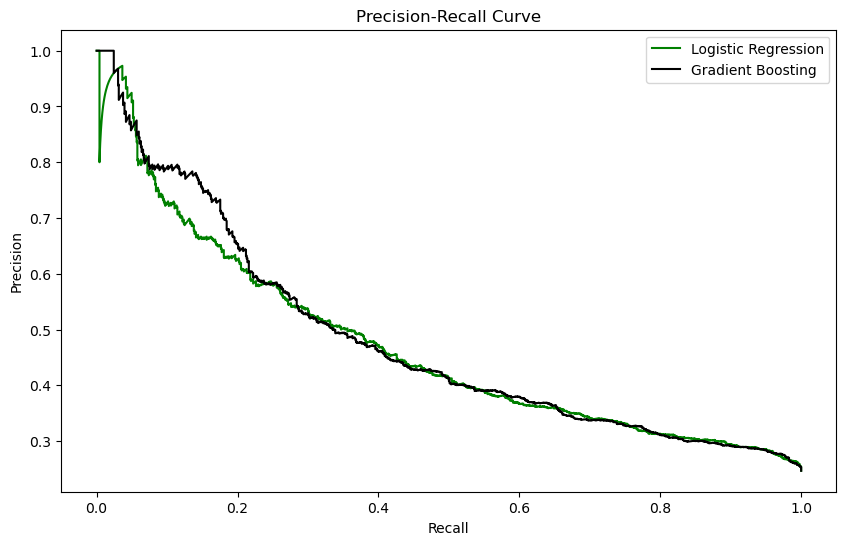

In [33]:
# Plot the precision-recall curve of two models on the same plot
fig, ax = plt.subplots(figsize=(10, 6))
log_precision, log_recall, _ = precision_recall_curve(y_test, log_reg.predict_proba(X_test)[:,1])
grad_precision, grad_recall, _ = precision_recall_curve(y_test, grad_boost.predict_proba(X_test)[:,1])

ax.plot(log_recall, log_precision, label="Logistic Regression", color="green")
ax.plot(grad_recall, grad_precision, label="Gradient Boosting", color="black")

ax.set_xlabel("Recall")
ax.set_ylabel("Precision")

ax.set_title("Precision-Recall Curve")
ax.legend()
plt.show()

**Observations**
- Same as before, the curve decreased suddenly for LR but increased sharply for GB and converge together

#### AUC-PR

In [74]:
# Print the AUC-PR score of the two models
print("Logistic Regression AUC-PR Score: ", average_precision_score(y_test, log_reg.predict_proba(X_test)[:,1]))
print("Gradient Boosting AUC-PR Score: ", average_precision_score(y_test, grad_boost.predict_proba(X_test)[:,1]))

Logistic Regression AUC-PR Score:  0.47091234354595257
Gradient Boosting AUC-PR Score:  0.47974413469928245


**Observations**
- The score for LR increased but the score for GB decreased after using One-Class SVM which might be due to the decrease in False Positives and True Positives

### Isolation Forest - Performance of Models After Outlier Detection

In [75]:
X, y = merged_df.drop(["label", "booking_id"], axis = 1), merged_df["label"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(X_train.shape)
print(y_train.shape)

(15977, 15)
(15977,)


In [76]:
iso_for = IsolationForest(contamination=0.04)
X_out = iso_for.fit_predict(X_train)
X_train, y_train = X_train[X_out == 1], y_train[X_out == 1]
print(X_train.shape)
print(y_train.shape)

(15337, 15)
(15337,)


**Observations**
- Isolation Forest detects about 640 data points as outliers.

In [77]:
# Logistic Regression
log_reg = LogisticRegression(random_state=42, max_iter = 50000)
with parallel_backend('dask'):
    log_reg.fit(X_train, y_train)
    y_pred_log_reg = log_reg.predict(X_test)

# Gradient Boosting
grad_boost = GradientBoostingClassifier(random_state=42, n_estimators=50)
with parallel_backend('dask'):
    grad_boost.fit(X_train, y_train)
    y_pred_grad_boost = grad_boost.predict(X_test)

# Cross validation results
log_reg_cv_results = cross_validate(log_reg, X_train, y_train, cv=5, scoring=score_metrics)
grad_boost_cv_results = cross_validate(grad_boost, X_train, y_train, cv=5, scoring=score_metrics)

# Return a dataframe that shows that mean score of all the cross validation results
results = pd.DataFrame([[log_reg_cv_results["fit_time"].mean(),log_reg_cv_results["test_f2"].mean(),log_reg_cv_results["test_recall"].mean(), log_reg_cv_results["test_precision"].mean(),
                        log_reg_cv_results["test_balanced_accuracy"].mean(), log_reg_cv_results["test_roc_auc_score"].mean()],
                        [grad_boost_cv_results["fit_time"].mean(),grad_boost_cv_results["test_f2"].mean(),grad_boost_cv_results["test_recall"].mean(), grad_boost_cv_results["test_precision"].mean(),
                        grad_boost_cv_results["test_balanced_accuracy"].mean(), grad_boost_cv_results["test_roc_auc_score"].mean()]],
                        columns=["Mean Fit Time", "Mean F2", " Mean Recall", "Mean Precision", "Mean Balanced Accuracy", "Mean ROC-AUC"], index=["Logistic Regression", "Gradient Boosting"])
display(round(results, 3))

,Mean Fit Time,Mean F2,Mean Recall,Mean Precision,Mean Balanced Accuracy,Mean ROC-AUC
Logistic Regression,0.296,0.185,0.158,0.624,0.564,0.703
Gradient Boosting,3.308,0.161,0.135,0.676,0.557,0.704


**Observations**
- After removing the outliers with Isolation Forest, the scores worsen for both models based on every score metrics.

In [45]:
# Store the results in the respective dataframes
lr_results.loc["Isolation Forest"] = results.iloc[0]
gb_results.loc["Isolation Forest"] = results.iloc[1]

#### Confusion Matrix

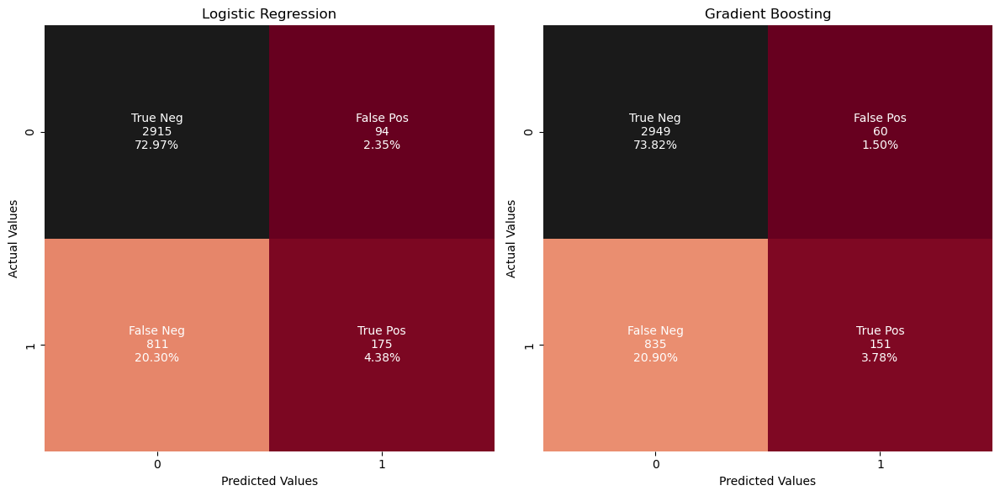

In [47]:
# Plot 2 heatmaps based on confusion matrices of the two models
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Logistic Regression
log_reg_cm = confusion_matrix(y_test, y_pred_log_reg)
log_reg_labels = ["True Neg","False Pos","False Neg","True Pos"]
log_reg_counts = ["{0:0.0f}".format(value) for value in log_reg_cm.flatten()]
log_reg_percentage = ["{0:.2%}".format(value) for value in log_reg_cm.flatten()/np.sum(log_reg_cm)]
log_reg_labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(log_reg_labels,log_reg_counts,log_reg_percentage)]
log_reg_labels = np.asarray(log_reg_labels).reshape(2,2)

sns.heatmap(confusion_matrix(y_test, y_pred_log_reg), annot=log_reg_labels, fmt="", ax=ax[0], cmap="RdGy", cbar=False)

# Gradient Boosting
grad_boost_cm = confusion_matrix(y_test, y_pred_grad_boost)
grad_boost_labels = ["True Neg","False Pos","False Neg","True Pos"]
grad_boost_counts = ["{0:0.0f}".format(value) for value in grad_boost_cm.flatten()]
grad_boost_percentage = ["{0:.2%}".format(value) for value in grad_boost_cm.flatten()/np.sum(grad_boost_cm)]
grad_boost_labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(grad_boost_labels,grad_boost_counts,grad_boost_percentage)]
grad_boost_labels = np.asarray(grad_boost_labels).reshape(2,2)

sns.heatmap(confusion_matrix(y_test, y_pred_grad_boost), annot=grad_boost_labels, fmt="", ax=ax[1], cmap="RdGy", cbar=False)

ax[0].set_title("Logistic Regression")
ax[0].set_ylabel("Actual Values")
ax[0].set_xlabel("Predicted Values")

ax[1].set_title("Gradient Boosting")
ax[1].set_ylabel("Actual Values")
ax[1].set_xlabel("Predicted Values")

plt.tight_layout()
plt.show()

**Observations**
- True Neg & True Pos for Logistic Regression have increased but worsens for Gradient Boosting

#### ROC Curve

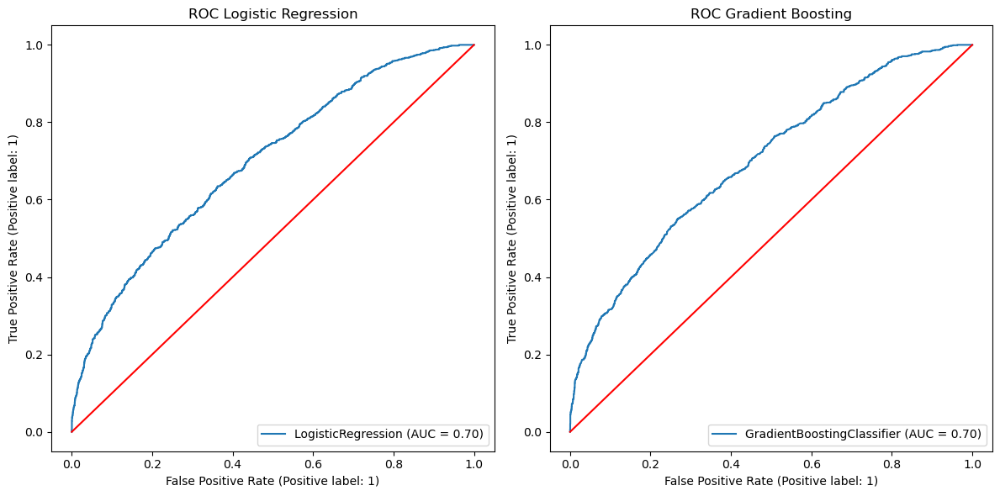

In [48]:
# Plot ROC curve
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Logistic Regression
log_reg_disp = RocCurveDisplay.from_estimator(log_reg, X_test, y_test, ax=ax[0])
x = np.linspace(0,1,2)
ax[0].plot(x,x,color="red")
ax[0].set_title("ROC Logistic Regression")

# Gradient Boosting
grad_boost_disp = RocCurveDisplay.from_estimator(grad_boost, X_test, y_test, ax=ax[1])
x = np.linspace(0,1,2)
ax[1].plot(x,x,color="red")
ax[1].set_title("ROC Gradient Boosting")

plt.tight_layout()
plt.show()

**Observations**
- ROC-AUC remains constant for both models

#### Precision-Recall Curve

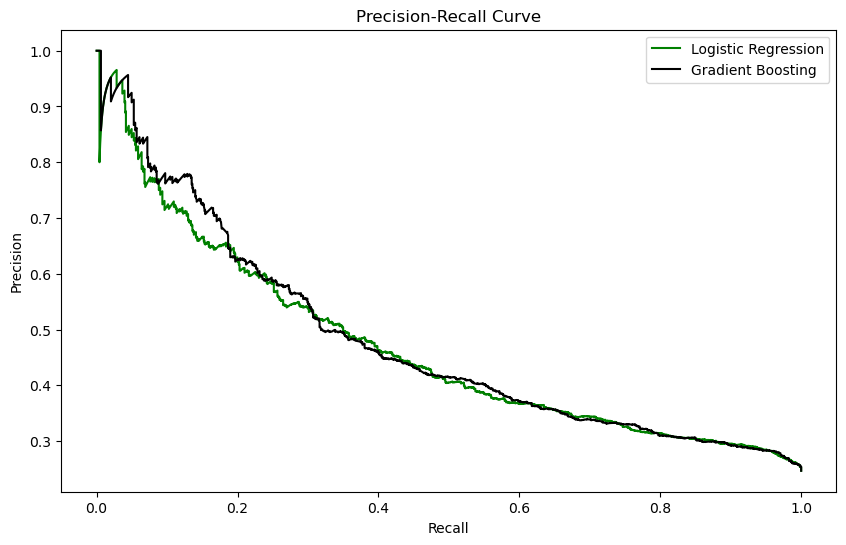

In [49]:
# Plot the precision-recall curve of two models on the same plot
fig, ax = plt.subplots(figsize=(10, 6))
log_precision, log_recall, _ = precision_recall_curve(y_test, log_reg.predict_proba(X_test)[:,1])
grad_precision, grad_recall, _ = precision_recall_curve(y_test, grad_boost.predict_proba(X_test)[:,1])

ax.plot(log_recall, log_precision, label="Logistic Regression", color="green")
ax.plot(grad_recall, grad_precision, label="Gradient Boosting", color="black")

ax.set_xlabel("Recall")
ax.set_ylabel("Precision")

ax.set_title("Precision-Recall Curve")
ax.legend()
plt.show()

**Observations**
- Both models had a sudden decrease and seems more unstable compared to the other models after using IsolationForest, which might be due to the decrease in precision and recall score.

In [78]:
# Print the AUC-PR score of the two models
print("Logistic Regression AUC-PR Score: ", average_precision_score(y_test, log_reg.predict_proba(X_test)[:,1]))
print("Gradient Boosting AUC-PR Score: ", average_precision_score(y_test, grad_boost.predict_proba(X_test)[:,1]))

Logistic Regression AUC-PR Score:  0.46958814768267015
Gradient Boosting AUC-PR Score:  0.4751530390006709


**Observations**
- LR shows an increase in AUC-PR and GB shows a decrease in AUC-PR after IsolationForest is used.

### Cluster-Based LOF - Performance of Models After Outlier Detection

In [79]:
X, y = merged_df.drop(["label", "booking_id"], axis = 1), merged_df["label"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(X_train.shape)
print(y_train.shape)

(15977, 15)
(15977,)


In [80]:
cb_lof = LocalOutlierFactor(contamination=0.04)
X_out = cb_lof.fit_predict(X_train)
X_train, y_train = X_train[X_out == 1], y_train[X_out == 1]
print(X_train.shape)
print(y_train.shape)

(15337, 15)
(15337,)


**Observations**
- Cluster-based LOF detects about 640 data points as outliers

In [81]:
# Logistic Regression
log_reg = LogisticRegression(random_state=42, max_iter = 50000)
with parallel_backend('dask'):
    log_reg.fit(X_train, y_train)
    y_pred_log_reg = log_reg.predict(X_test)

# Gradient Boosting
grad_boost = GradientBoostingClassifier(random_state=42, n_estimators=50)
with parallel_backend('dask'):
    grad_boost.fit(X_train, y_train)
    y_pred_grad_boost = grad_boost.predict(X_test)

# Cross validation results
log_reg_cv_results = cross_validate(log_reg, X_train, y_train, cv=5, scoring=score_metrics)
grad_boost_cv_results = cross_validate(grad_boost, X_train, y_train, cv=5, scoring=score_metrics)

# Return a dataframe that shows that mean score of all the cross validation results
results = pd.DataFrame([[log_reg_cv_results["fit_time"].mean(),log_reg_cv_results["test_f2"].mean(),log_reg_cv_results["test_recall"].mean(), log_reg_cv_results["test_precision"].mean(),
                        log_reg_cv_results["test_balanced_accuracy"].mean(), log_reg_cv_results["test_roc_auc_score"].mean()],
                        [grad_boost_cv_results["fit_time"].mean(),grad_boost_cv_results["test_f2"].mean(),grad_boost_cv_results["test_recall"].mean(), grad_boost_cv_results["test_precision"].mean(),
                        grad_boost_cv_results["test_balanced_accuracy"].mean(), grad_boost_cv_results["test_roc_auc_score"].mean()]],
                        columns=["Mean Fit Time", "Mean F2", " Mean Recall", "Mean Precision", "Mean Balanced Accuracy", "Mean ROC-AUC"], index=["Logistic Regression", "Gradient Boosting"])
display(round(results, 3))

,Mean Fit Time,Mean F2,Mean Recall,Mean Precision,Mean Balanced Accuracy,Mean ROC-AUC
Logistic Regression,0.246,0.218,0.187,0.647,0.577,0.709
Gradient Boosting,3.302,0.185,0.156,0.694,0.567,0.709


**Observations**
- After removing the outliers with Cluster-based LOF, the scores worsen for both models based on every score metrics.

In [53]:
# Store the results in the respective dataframes
lr_results.loc["Cluster-based LOF"] = results.iloc[0]
gb_results.loc["Cluster-based LOF"] = results.iloc[1]

#### Confusion Matrix

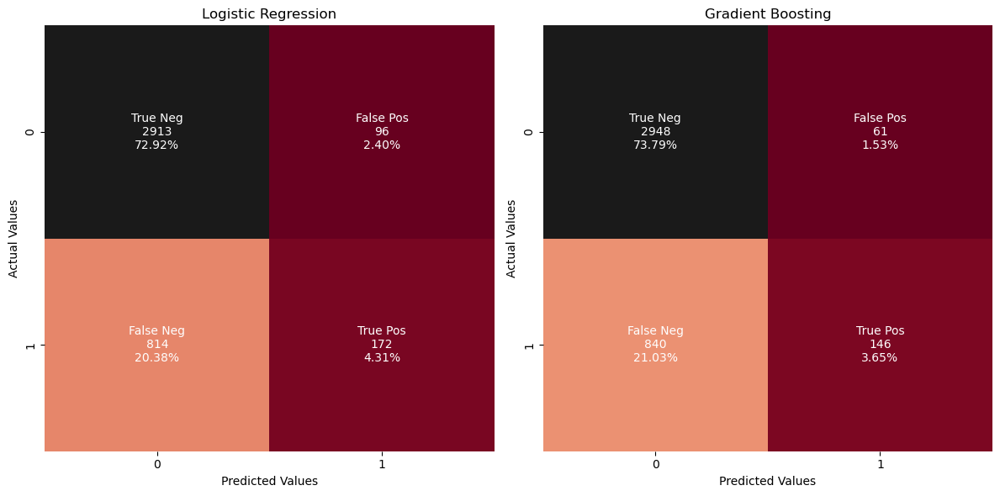

In [55]:
# Plot 2 heatmaps based on confusion matrices of the two models
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Logistic Regression
log_reg_cm = confusion_matrix(y_test, y_pred_log_reg)
log_reg_labels = ["True Neg","False Pos","False Neg","True Pos"]
log_reg_counts = ["{0:0.0f}".format(value) for value in log_reg_cm.flatten()]
log_reg_percentage = ["{0:.2%}".format(value) for value in log_reg_cm.flatten()/np.sum(log_reg_cm)]
log_reg_labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(log_reg_labels,log_reg_counts,log_reg_percentage)]
log_reg_labels = np.asarray(log_reg_labels).reshape(2,2)

sns.heatmap(confusion_matrix(y_test, y_pred_log_reg), annot=log_reg_labels, fmt="", ax=ax[0], cmap="RdGy", cbar=False)

# Gradient Boosting
grad_boost_cm = confusion_matrix(y_test, y_pred_grad_boost)
grad_boost_labels = ["True Neg","False Pos","False Neg","True Pos"]
grad_boost_counts = ["{0:0.0f}".format(value) for value in grad_boost_cm.flatten()]
grad_boost_percentage = ["{0:.2%}".format(value) for value in grad_boost_cm.flatten()/np.sum(grad_boost_cm)]
grad_boost_labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(grad_boost_labels,grad_boost_counts,grad_boost_percentage)]
grad_boost_labels = np.asarray(grad_boost_labels).reshape(2,2)

sns.heatmap(confusion_matrix(y_test, y_pred_grad_boost), annot=grad_boost_labels, fmt="", ax=ax[1], cmap="RdGy", cbar=False)

ax[0].set_title("Logistic Regression")
ax[0].set_ylabel("Actual Values")
ax[0].set_xlabel("Predicted Values")

ax[1].set_title("Gradient Boosting")
ax[1].set_ylabel("Actual Values")
ax[1].set_xlabel("Predicted Values")

plt.tight_layout()
plt.show()

**Observations**
- Logistic Regression shows that True Neg increased whereas True Pos reduced by 1 after Cluster-based LOF whereas Gradient Boosting shows that the True Neg & True Pos worsens after Cluster-based LOF

#### ROC Curve

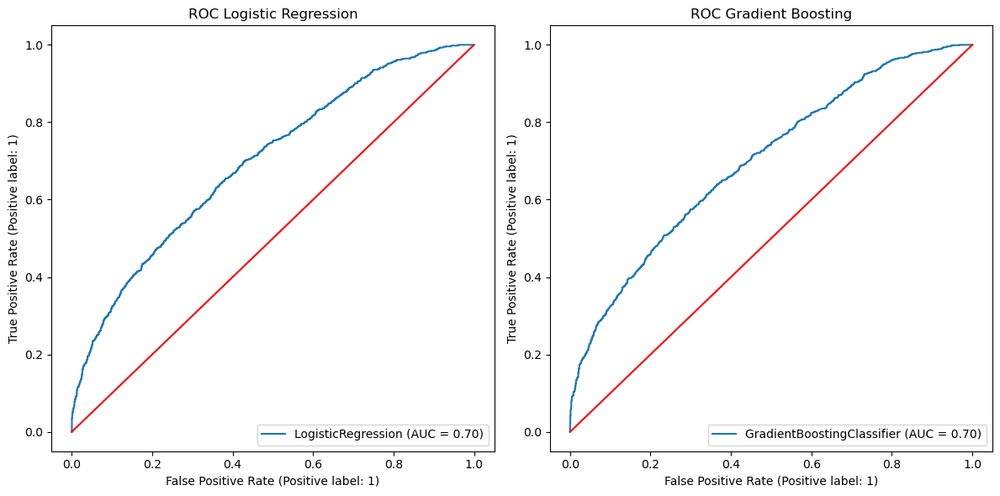

In [56]:
# Plot ROC curve
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Logistic Regression
log_reg_disp = RocCurveDisplay.from_estimator(log_reg, X_test, y_test, ax=ax[0])
x = np.linspace(0,1,2)
ax[0].plot(x,x,color="red")
ax[0].set_title("ROC Logistic Regression")

# Gradient Boosting
grad_boost_disp = RocCurveDisplay.from_estimator(grad_boost, X_test, y_test, ax=ax[1])
x = np.linspace(0,1,2)
ax[1].plot(x,x,color="red")
ax[1].set_title("ROC Gradient Boosting")

plt.tight_layout()
plt.show()

**Observations**
- ROC-AUC remains constant for both models even after applying Cluster-based LOF

#### Precision-Recall Curve

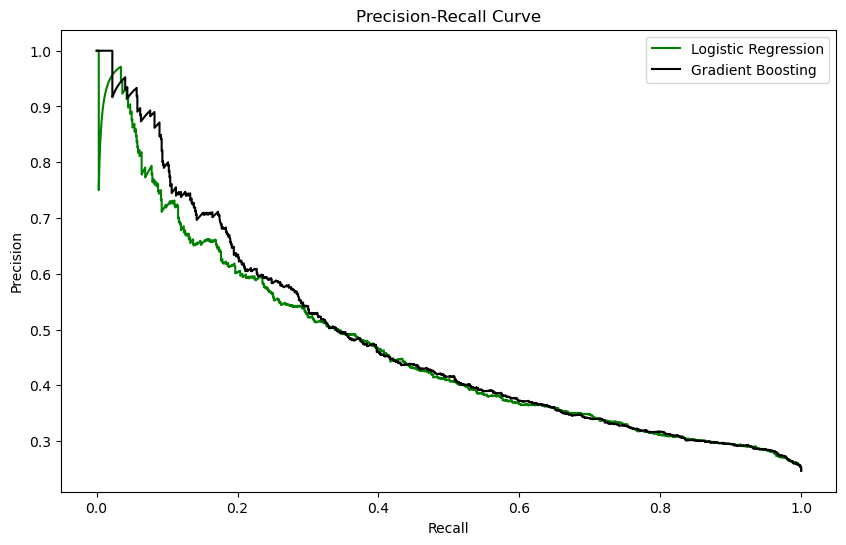

In [57]:
# Plot the precision-recall curve of two models on the same plot
fig, ax = plt.subplots(figsize=(10, 6))
log_precision, log_recall, _ = precision_recall_curve(y_test, log_reg.predict_proba(X_test)[:,1])
grad_precision, grad_recall, _ = precision_recall_curve(y_test, grad_boost.predict_proba(X_test)[:,1])

ax.plot(log_recall, log_precision, label="Logistic Regression", color="green")
ax.plot(grad_recall, grad_precision, label="Gradient Boosting", color="black")

ax.set_xlabel("Recall")
ax.set_ylabel("Precision")

ax.set_title("Precision-Recall Curve")
ax.legend()
plt.show()

#### AUC-PR

In [82]:
# Print the AUC-PR score of the two models
print("Logistic Regression AUC-PR Score: ", average_precision_score(y_test, log_reg.predict_proba(X_test)[:,1]))
print("Gradient Boosting AUC-PR Score: ", average_precision_score(y_test, grad_boost.predict_proba(X_test)[:,1]))

Logistic Regression AUC-PR Score:  0.4671371324587868
Gradient Boosting AUC-PR Score:  0.48106268271461466


**Observations**
- LR AUC-PR and GB AUC-PR scores decreased after using Cluster-based LOF.

### Elliptic Envelope - Performance of Models After Outlier Detection

In [83]:
X, y = merged_df.drop(["label", "booking_id"], axis = 1), merged_df["label"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(X_train.shape)
print(y_train.shape)

(15977, 15)
(15977,)


In [84]:
ec = EllipticEnvelope(contamination=0.04)
X_out = ec.fit_predict(X_train)
X_train, y_train = X_train[X_out == 1], y_train[X_out == 1]
print(X_train.shape)
print(y_train.shape)

(15337, 15)
(15337,)


**Observations**
- Elliptic Envelope detects about 640 data points as outliers.

In [85]:
# Logistic Regression
log_reg = LogisticRegression(random_state=42, max_iter = 50000)
with parallel_backend('dask'):
    log_reg.fit(X_train, y_train)
    y_pred_log_reg = log_reg.predict(X_test)

# Gradient Boosting
grad_boost = GradientBoostingClassifier(random_state=42, n_estimators=50)
with parallel_backend('dask'):
    grad_boost.fit(X_train, y_train)
    y_pred_grad_boost = grad_boost.predict(X_test)

# Cross validation results
log_reg_cv_results = cross_validate(log_reg, X_train, y_train, cv=5, scoring=score_metrics)
grad_boost_cv_results = cross_validate(grad_boost, X_train, y_train, cv=5, scoring=score_metrics)

# Return a dataframe that shows that mean score of all the cross validation results
results = pd.DataFrame([[log_reg_cv_results["fit_time"].mean(),log_reg_cv_results["test_f2"].mean(),log_reg_cv_results["test_recall"].mean(), log_reg_cv_results["test_precision"].mean(),
                        log_reg_cv_results["test_balanced_accuracy"].mean(), log_reg_cv_results["test_roc_auc_score"].mean()],
                        [grad_boost_cv_results["fit_time"].mean(),grad_boost_cv_results["test_f2"].mean(),grad_boost_cv_results["test_recall"].mean(), grad_boost_cv_results["test_precision"].mean(),
                        grad_boost_cv_results["test_balanced_accuracy"].mean(), grad_boost_cv_results["test_roc_auc_score"].mean()]],
                        columns=["Mean Fit Time", "Mean F2", " Mean Recall", "Mean Precision", "Mean Balanced Accuracy", "Mean ROC-AUC"], index=["Logistic Regression", "Gradient Boosting"])
display(round(results, 3))

,Mean Fit Time,Mean F2,Mean Recall,Mean Precision,Mean Balanced Accuracy,Mean ROC-AUC
Logistic Regression,0.286,0.241,0.208,0.667,0.587,0.715
Gradient Boosting,3.264,0.211,0.180,0.728,0.579,0.717


**Observations**
- Overall, the score metrics for both model relatively improved from before, after using EllipticalEnvelope
- F2 improved by approximately 0.002 in Logistic Regression and improved by approximately 0.0003 in Gradient Boosting
- Recall improved by 0.001 in Logistic Regression and improved by 0.0003 in Gradient Boosting
- Precision improved by 0.0041 in Logistic Regression but however worsen by 0.002 in Gradient Boosting
- Balanced Accuracy & ROC-AUC have also improved

In [86]:
# Store the results in the respective dataframes
lr_results.loc["Elliptic Envelope"] = results.iloc[0]
gb_results.loc["Elliptic Envelope"] = results.iloc[1]

#### Confusion Matrix

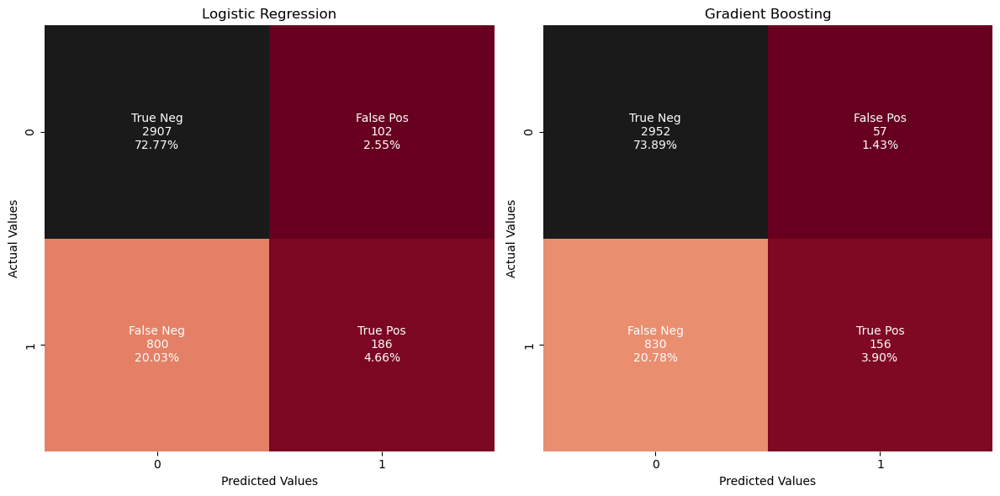

In [87]:
# Plot 2 heatmaps based on confusion matrices of the two models
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Logistic Regression
log_reg_cm = confusion_matrix(y_test, y_pred_log_reg)
log_reg_labels = ["True Neg","False Pos","False Neg","True Pos"]
log_reg_counts = ["{0:0.0f}".format(value) for value in log_reg_cm.flatten()]
log_reg_percentage = ["{0:.2%}".format(value) for value in log_reg_cm.flatten()/np.sum(log_reg_cm)]
log_reg_labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(log_reg_labels,log_reg_counts,log_reg_percentage)]
log_reg_labels = np.asarray(log_reg_labels).reshape(2,2)

sns.heatmap(confusion_matrix(y_test, y_pred_log_reg), annot=log_reg_labels, fmt="", ax=ax[0], cmap="RdGy", cbar=False)

# Gradient Boosting
grad_boost_cm = confusion_matrix(y_test, y_pred_grad_boost)
grad_boost_labels = ["True Neg","False Pos","False Neg","True Pos"]
grad_boost_counts = ["{0:0.0f}".format(value) for value in grad_boost_cm.flatten()]
grad_boost_percentage = ["{0:.2%}".format(value) for value in grad_boost_cm.flatten()/np.sum(grad_boost_cm)]
grad_boost_labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(grad_boost_labels,grad_boost_counts,grad_boost_percentage)]
grad_boost_labels = np.asarray(grad_boost_labels).reshape(2,2)

sns.heatmap(confusion_matrix(y_test, y_pred_grad_boost), annot=grad_boost_labels, fmt="", ax=ax[1], cmap="RdGy", cbar=False)

ax[0].set_title("Logistic Regression")
ax[0].set_ylabel("Actual Values")
ax[0].set_xlabel("Predicted Values")

ax[1].set_title("Gradient Boosting")
ax[1].set_ylabel("Actual Values")
ax[1].set_xlabel("Predicted Values")

plt.tight_layout()
plt.show()

**Observations**
- True Postitives in both models & True Negative in Logistic Regression have increased whereas True Negative in Gradient Boosting have decreased from before which is why the precision worsened in Logistic Regression but improved in Gradient Boosting

#### ROC Curve

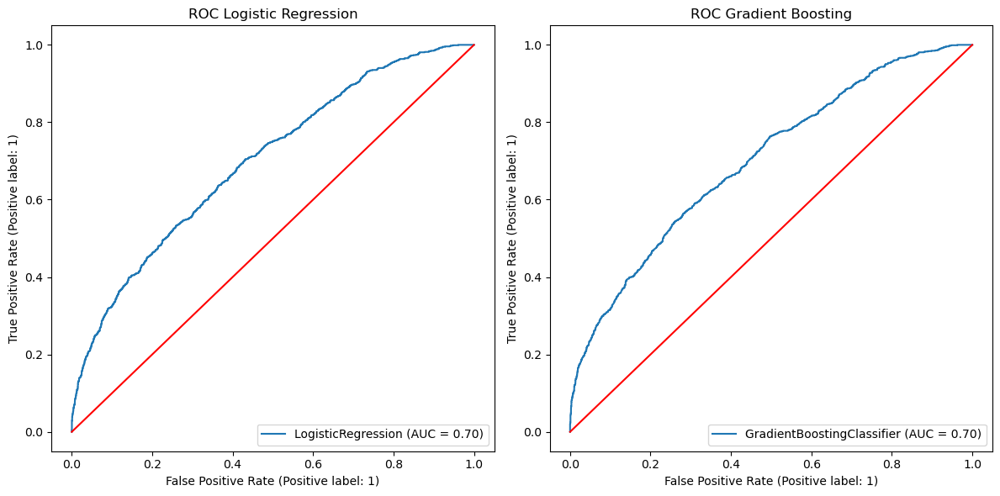

In [88]:
# Plot ROC curve
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Logistic Regression
log_reg_disp = RocCurveDisplay.from_estimator(log_reg, X_test, y_test, ax=ax[0])
x = np.linspace(0,1,2)
ax[0].plot(x,x,color="red")
ax[0].set_title("ROC Logistic Regression")

# Gradient Boosting
grad_boost_disp = RocCurveDisplay.from_estimator(grad_boost, X_test, y_test, ax=ax[1])
x = np.linspace(0,1,2)
ax[1].plot(x,x,color="red")
ax[1].set_title("ROC Gradient Boosting")

plt.tight_layout()
plt.show()

**Observations**
- AUC-ROC remained constant in both models.

#### Precision-Recall Curve

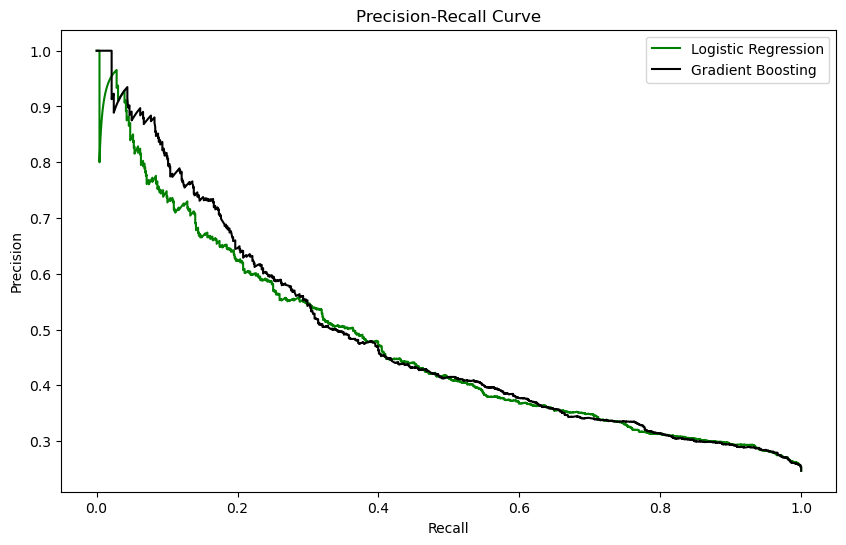

In [89]:
# Plot the precision-recall curve of two models on the same plot
fig, ax = plt.subplots(figsize=(10, 6))
log_precision, log_recall, _ = precision_recall_curve(y_test, log_reg.predict_proba(X_test)[:,1])
grad_precision, grad_recall, _ = precision_recall_curve(y_test, grad_boost.predict_proba(X_test)[:,1])

ax.plot(log_recall, log_precision, label="Logistic Regression", color="green")
ax.plot(grad_recall, grad_precision, label="Gradient Boosting", color="black")

ax.set_xlabel("Recall")
ax.set_ylabel("Precision")

ax.set_title("Precision-Recall Curve")
ax.legend()
plt.show()

In [90]:
# Print the AUC-PR score of the two models
print("Logistic Regression AUC-PR Score: ", average_precision_score(y_test, log_reg.predict_proba(X_test)[:,1]))
print("Gradient Boosting AUC-PR Score: ", average_precision_score(y_test, grad_boost.predict_proba(X_test)[:,1]))

Logistic Regression AUC-PR Score:  0.47163627263658003
Gradient Boosting AUC-PR Score:  0.48344649846430704


**Observations**
- LR AUC-PR increased and GB AUC-PR decreased but still the highest after removing outliers.

### Conclusion

In [92]:
print("Logistic Regression Results")
display(lr_results)
print()
print("Gradient Boosting Results")
display(gb_results)

Logistic Regression Results


,Mean Fit Time,Mean F2,Mean Recall,Mean Precision,Mean Balanced Accuracy,Mean ROC-AUC
Before Handling Outliers,0.702330,0.239903,0.206918,0.662240,0.585895,0.715287
One-Class SVM,0.394111,0.182035,0.154778,0.616881,0.562073,0.698376
Isolation Forest,0.358345,0.187216,0.159294,0.626606,0.564629,0.702822
Cluster-based LOF,0.228735,0.218056,0.187088,0.647054,0.576779,0.708937
Elliptic Envelope,0.286477,0.241474,0.208267,0.667289,0.586772,0.715131



Gradient Boosting Results


,Mean Fit Time,Mean F2,Mean Recall,Mean Precision,Mean Balanced Accuracy,Mean ROC-AUC
Before Handling Outliers,3.392246,0.209459,0.177857,0.725924,0.577748,0.715833
One-Class SVM,3.225659,0.147707,0.123553,0.680444,0.552441,0.698469
Isolation Forest,3.215946,0.158963,0.133514,0.669485,0.556330,0.703085
Cluster-based LOF,3.210773,0.184605,0.155995,0.694401,0.566691,0.709115
Elliptic Envelope,3.263719,0.211496,0.179665,0.727814,0.578563,0.717094


**Observations**
- Elliptical Envelope is the best outlier detection model to be used out of all the other models for this dataset due to the improvement in F2, Recall & even in the Fit Time.

## Handling Imbalanced Classes
**Ways of handling imbalanced classes**
- Data Level Methods:
    - Oversampling - Zero information loss, but increases likelihood of overfitting
    - Undersampling - Improves run time and storage, but will discard useful information
    - SMOTE - Mitigates problems of overfitting and information loss, but not very effective for high dimensional data
- Algorithm-level methods:
    - Class Weight Adjustment - Improves recall of minority class, but in the mean time brings down precision significantly
    - XGBoost - Simple to implement and generalize well, but sensitive to noisy data and outliers
- Hybrid methods:
    - Combination of data level methods and algorithm-level methods

### Before Handling Imbalanced Classes
- We shall check out the count of the labels in the dataset

In [23]:
# Split data into X and y
X, y = merged_df.drop(["label", "booking_id"], axis = 1), merged_df["label"]

# Split data into train and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [19]:
# Initiate client
client = Client()

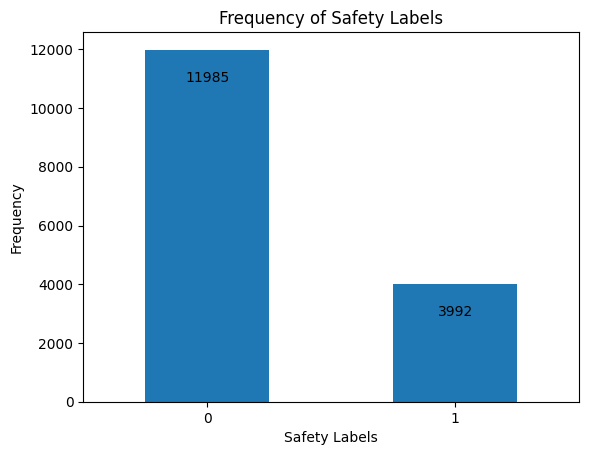

In [16]:
# Visualize the class distribution based on the class labels
ax1 = y_train.value_counts().plot(
    kind='bar', 
    title="Frequency of Safety Labels",
    rot=0,
    xlabel='Safety Labels',
    ylabel='Frequency'
)

# Plot the counts of the labels in the bars
for p in ax1.patches:
    ax1.annotate(str(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0,-20), textcoords='offset points')

**Observations**
- There is clearly more safe trips as labels than unsafe trips as labels which means that the data is imbalanced.

In [20]:
# Define the gradient boosting model
grad_boost = GradientBoostingClassifier(random_state=42, n_estimators=50)
with parallel_backend('dask'):
    grad_boost.fit(X_train, y_train)
    y_pred_grad_boost = grad_boost.predict(X_test)

# Print the classification report before handling the imbalanced dataset
print(classification_report(y_test, y_pred_grad_boost, target_names=["Unsafe", "Safe"]))

              precision    recall  f1-score   support

      Unsafe       0.79      0.97      0.87      3009
        Safe       0.71      0.19      0.30       986

    accuracy                           0.78      3995
   macro avg       0.75      0.58      0.59      3995
weighted avg       0.77      0.78      0.73      3995



**Observations**
- Imbalanced number of classes with way more counts for unsafe labels than safe labels
- Significantly low recall and f1-score for safe labels compared to unsafe labels

### Data-level Methods - Undersampling

In [24]:
rand_us = RandomUnderSampler(random_state=42)

# Make a copy of X and y
X_copy, y_copy = X.copy(), y.copy()

# Resample the data
X_res, y_res = rand_us.fit_resample(X_copy, y_copy)

# Split the resampled data into train and test set
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.2, random_state=42)

# Define the model
grad_boost = GradientBoostingClassifier(random_state=42, n_estimators=50)
with parallel_backend('dask'):
    grad_boost.fit(X_train, y_train)
    y_pred_grad_boost = grad_boost.predict(X_test)

# Print the classification report after handling the imbalanced dataset
print(classification_report(y_test, y_pred_grad_boost, target_names=["Unsafe", "Safe"]))

              precision    recall  f1-score   support

      Unsafe       0.66      0.65      0.65      1019
        Safe       0.64      0.64      0.64       973

    accuracy                           0.65      1992
   macro avg       0.65      0.65      0.65      1992
weighted avg       0.65      0.65      0.65      1992



**Observations**
- Still creates an imbalanced number of classes with more counts for unsafe labels than safe labels
- Improved the score metrics recall and f1-score for safe labels and reduces the bias on score metrics for unsafe labels
- Significantly reduces the score metrics overall and creates a loss of data

### Data-level Methods - Oversampling

In [25]:
rand_os = RandomOverSampler(random_state=42)

# Make a copy of X and y
X_copy, y_copy = X.copy(), y.copy()

# Resample the data
X_res, y_res = rand_os.fit_resample(X_copy, y_copy)

# Split the resampled data into train and test set
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.2, random_state=42)

# Define the model
grad_boost = GradientBoostingClassifier(random_state=42, n_estimators=50)
with parallel_backend('dask'):
    grad_boost.fit(X_train, y_train)
    y_pred_grad_boost = grad_boost.predict(X_test)

# Print the classification report after handling the imbalanced dataset
print(classification_report(y_test, y_pred_grad_boost, target_names=["Unsafe", "Safe"]))

              precision    recall  f1-score   support

      Unsafe       0.66      0.72      0.69      3001
        Safe       0.69      0.64      0.66      2997

    accuracy                           0.68      5998
   macro avg       0.68      0.68      0.68      5998
weighted avg       0.68      0.68      0.68      5998



**Observations**
- Create a more balanced number of labels between safe and unsafe labels
- Every score metric of safe labels is still lesser than every score metric of unsafe labels
- Increase the recall score by 0.45 and f1-score by 0.36 on safe labels.

### Data-level Methods - SMOTE

In [26]:
smote = SMOTE(random_state=42)

# Make a copy of X and y
X_copy, y_copy = X.copy(), y.copy()

# Resample the data
X_res, y_res = smote.fit_resample(X_copy, y_copy)

# Split the resampled data into train and test set
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.2, random_state=42)

# Define the model
grad_boost = GradientBoostingClassifier(random_state=42, n_estimators=50)
with parallel_backend('dask'):
    grad_boost.fit(X_train, y_train)
    y_pred_grad_boost = grad_boost.predict(X_test)

# Print the classification report after handling the imbalanced dataset
print(classification_report(y_test, y_pred_grad_boost, target_names=["Unsafe", "Safe"]))

              precision    recall  f1-score   support

      Unsafe       0.71      0.70      0.70      3001
        Safe       0.70      0.71      0.71      2997

    accuracy                           0.70      5998
   macro avg       0.70      0.70      0.70      5998
weighted avg       0.70      0.70      0.70      5998



**Observations**
- Create a more balanced number of labels between safe and unsafe labels
- Every score metric of safe labels is roughly equal to every score metric of unsafe labels
- Increase the recall score by 0.52 and f1-score by 0.41 on safe labels

### Algorithm Methods - Class Weight Adjustment

In [33]:
# Use weights to give more importance to the minority class
X_copy, y_copy = X.copy(), y.copy()

# Split the resampled data into train and test set
X_train, X_test, y_train, y_test = train_test_split(X_copy, y_copy, test_size=0.2, random_state=42)

# Compute class weights
weights = compute_class_weight(class_weight="balanced", classes=np.unique(y_train), y=y_train)

# Create a dictionary of the class weights
weights_dict = dict(zip(np.unique(y_train), weights))

# Define the model
grad_boost = GradientBoostingClassifier(random_state=42, n_estimators=50)
with parallel_backend('dask'):
    grad_boost.fit(X_train, y_train, sample_weight=y_train.map(weights_dict))
    y_pred_grad_boost = grad_boost.predict(X_test)

# Print the classification report after handling the imbalanced dataset
print(classification_report(y_test, y_pred_grad_boost, target_names=["Unsafe", "Safe"]))

              precision    recall  f1-score   support

      Unsafe       0.85      0.72      0.78      3009
        Safe       0.41      0.60      0.49       986

    accuracy                           0.69      3995
   macro avg       0.63      0.66      0.63      3995
weighted avg       0.74      0.69      0.71      3995



**Observations**
- Still creates an imbalanced number of classes with more counts for unsafe labels than safe labels
- Reduced the f1-score and still have lower score metrics for safe labels than unsafe labels
- Significantly reduces the score metrics overall and creates a loss of data

### Algorithm Methods - Boosting Models

In [34]:
# Make a copy of X and y
X_copy, y_copy = X.copy(), y.copy()

# Split the resampled data into train and test set
X_train, X_test, y_train, y_test = train_test_split(X_copy, y_copy, test_size=0.2, random_state=42)

# Define the model
xgboost = XGBClassifier(random_state=42, n_estimators=50)
with parallel_backend('dask'):
    xgboost.fit(X_train, y_train)
    y_pred_xgboost = xgboost.predict(X_test)

# Print the classification report after handling the imbalanced dataset
print(classification_report(y_test, y_pred_xgboost, target_names=["Unsafe", "Safe"]))

              precision    recall  f1-score   support

      Unsafe       0.79      0.94      0.86      3009
        Safe       0.59      0.24      0.34       986

    accuracy                           0.77      3995
   macro avg       0.69      0.59      0.60      3995
weighted avg       0.74      0.77      0.73      3995



**Observations**
- Still creates an imbalanced number of classes with more counts for unsafe labels than safe labels
- Reduced the f1-score and still have lower score metrics for safe labels than unsafe labels
- Score metrics are lowest compared to other ways of handling imbalanced classes

### Hybrid Methods - SMOTE & Class Weight Adjustment

In [36]:
# Use SMOTE & weights to give more importance to the minority class
smote = SMOTE(random_state=42)

# Make a copy of X and y
X_copy, y_copy = X.copy(), y.copy()

# Resample the data
X_res, y_res = smote.fit_resample(X_copy, y_copy)

# Split the resampled data into train and test set
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.2, random_state=42)

# Compute class weights
weights = compute_class_weight(class_weight="balanced", classes=np.unique(y_train), y=y_train)

# Create a dictionary of the class weights
weights_dict = dict(zip(np.unique(y_train), weights))

# Define the model
grad_boost = GradientBoostingClassifier(random_state=42, n_estimators=50)
with parallel_backend('dask'):
    grad_boost.fit(X_train, y_train, sample_weight=y_train.map(weights_dict))
    y_pred_grad_boost = grad_boost.predict(X_test)

# Print the classification report after handling the imbalanced dataset
print(classification_report(y_test, y_pred_grad_boost, target_names=["Unsafe", "Safe"]))

              precision    recall  f1-score   support

      Unsafe       0.71      0.70      0.70      3001
        Safe       0.70      0.71      0.71      2997

    accuracy                           0.71      5998
   macro avg       0.71      0.71      0.71      5998
weighted avg       0.71      0.71      0.71      5998



**Observations**
- Create a more balanced number of labels between safe and unsafe labels
- Every score metric of safe labels is roughly equal to every score metric of unsafe labels
- Increase the recall score by 0.52 and f1-score by 0.41 on safe labels
- Best score metrics compared to other ways of handling imbalanced classes

## Scalable Machine Learning & Optimization

### Dask
- Dask is a library with the features of parallelism and scalability that is useful for modelling tasks that involves huge dataset
- Allows us to scale computations down to make it possible to work with large datasets on a single machine and provides parallel computing capabilities which greatly reduce the time taken to train each model

In [2]:
# Instantiate dask client
client = Client()

# Enable the active memory manager that optimizes the memory usage of workers across the Dask cluster
client.amm.start()

In [3]:
# Load data as pandas dataframe
taxi_df = pd.read_hdf("./Datasets/merged_df.h5", key="merged_df")

In [4]:
taxi_df.shape

(19972, 17)

In [5]:
taxi_df.columns

Index(['booking_id', 'label', 'accuracy', 'bearing', 'acceleration_x',
       'acceleration_y', 'acceleration_z', 'gyro_x', 'gyro_y', 'gyro_z',
       'second', 'speed', 'gyro_magnitude', 'pitch', 'roll', 'yaw',
       'distance'],
      dtype='object')

### Splitting train & test dataframes
- Ensure that booking_id and label are not in X as booking_id is now unique in every row, whereas label is the target feature
- Split into 80% train data, 20% test data

In [6]:
# Split X & y
X, y = taxi_df.drop(["label", "booking_id"], axis=1), taxi_df["label"]

In [7]:
# Applying SMOTE on the data before splitting into train and test set
smote = SMOTE(random_state=42)

# Resample the data
X_res, y_res = smote.fit_resample(X, y)

X_res.shape, y_res.shape

((29988, 15), (29988,))

In [8]:
# Split the dataset into train and test
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.2, random_state=42)

In [9]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(23990, 15)
(5998, 15)
(23990,)
(5998,)


### Remove Outliers
- As Elliptic Envelope is the best method of removing outliers, we shall be using that method.

In [10]:
# Define the outlier model
ee = EllipticEnvelope(contamination=0.04)

# Fit the model
df_arr = ee.fit_predict(X_train)

In [11]:
# Redefine the arrays of X_train & y_train such that the outliers are removed
X_train, y_train = X_train[df_arr == 1], y_train[df_arr == 1]

In [12]:
X_train

,accuracy,bearing,acceleration_x,acceleration_y,acceleration_z,gyro_x,gyro_y,gyro_z,second,speed,gyro_magnitude,pitch,roll,yaw,distance
8528,4.584984,180.111481,-0.685975,9.467266,-0.306900,0.002170,0.000310,0.000415,518.097107,32.349496,0.050030,1.424711,-0.083198,-0.036941,9.561073
618,3.628897,174.576904,-0.079030,9.162133,-1.007029,-0.004977,-0.011770,0.009163,630.265625,26.312613,0.196222,1.411079,-0.009373,-0.112983,9.275196
20921,5.485665,132.500519,-0.223398,9.575660,0.093842,0.003565,0.004673,0.000802,1107.530668,24.757458,0.128567,1.379952,-0.023272,0.011870,12.592840
24410,5.273267,177.851440,0.246318,9.643355,1.023326,-0.065280,-0.061721,0.042761,586.868360,39.144491,0.159488,1.404302,0.028359,0.113190,15.247964
22277,4.110458,106.493683,0.046637,9.486046,1.239995,-0.001667,0.011184,0.000292,516.558662,39.808810,0.064918,1.363440,0.006221,0.130684,11.732458
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21575,8.088890,182.399200,-0.609407,-8.037170,-4.781757,0.001091,0.015034,-0.006712,459.961632,26.237608,0.153258,-0.985293,-0.064229,-0.513595,6.343296
29802,5.902829,222.199417,0.627596,9.288057,1.372533,0.005853,-0.012633,0.003792,359.426597,52.582252,0.198077,1.324473,0.072831,0.130909,10.360820
5390,4.691965,128.610703,0.196764,9.598499,-1.064901,0.002058,0.002358,0.003038,691.876190,57.273119,0.137249,1.370577,0.023115,-0.114265,20.968325
15795,4.632975,83.425896,0.741558,9.348024,-2.915523,-0.003043,0.008486,-0.002870,597.566667,39.969812,0.044403,1.230345,0.075607,-0.306857,13.301065


In [13]:
y_train

8528     1
618      0
20921    1
24410    1
22277    1
        ..
21575    1
29802    1
5390     1
15795    0
23654    1
Name: label, Length: 23030, dtype: int16

**Observations**
- Elliptic Envelope removed about 960 data as outliers which makes up 4% of the data, leaving 23030 rows of data.

### <u>Initial Implementation</u> (Not Used)
#### Categorical Encoding (Binary Encoding)
- Initially, we were using `booking_id` and `driver_id` as part of our features, hence we encoding using BinaryEncoding to encode them since they are categorical data
- Binary Encoding basically encodes each value of the feature as binary value, bringing `booking_id` to 14 columns and `driver_id` to 8 columns

### Pipelines
- Allows us to streamline machine learning process by compiling the preparation and transformation steps.

In [14]:
# Imbalance transformer (step 1)
imbalance_transformer = SMOTE(random_state=42)

# Scaling transformer (step 2)
scaling_transformer = StandardScaler()

# Main pipeline
pipeline = steps=[
    ('smote', imbalance_transformer),
    ('preprocessor', scaling_transformer),
    ('model') # (step 3)
]

model_step = len(pipeline)-1

### Model Selection
Here are some reasons and benefits of why I have selected these models for classification.

<b><u>Random Forest</u></b><br>
- Build multiple decision trees on different subsets of input features and training data and aggregate predictions of individual trees to make a final prediction <br>
- Reduces risk of overfitting <br>
- Robust to noisy data, irrelevant features <br>

<b><u>Logistic Regression</u></b><br>
- Measures the probability of whether the customer default payment using a sigmoid function <br>
- Predicted y-value lies below threshold y=0 and lie above threshold y=1 to show whether the taxi trip is dangerous or not<br>
- Easy model to implement <br>
    
<b><u>Naive Bayes</u></b><br>
- Treat each feature independently and uses Bayes Theorem to find out how the target variable is classified <br>
    
<b><u>Decision Tree</u></b><br>
- Predict the customers who default and do not default payment by subsetting data into smaller groups based on different attributes (ex. speed, seconds, gyro) <br>
    
<b><u>Gradient Boosting</u></b><br>
- Ensemble model that combines several weak models to create a strong model (Prediction based on aggregation of all predictions of all trees in the sequence) <br>

<b><u>XGBoost</u></b><br>
- Builds a series of decision trees sequentially, with each tree trying to correct the errors of the previous ones<br>
- Incorporates L1(lasso) & L2(ridge) regularization terms into the objective function to control overfitting <br>

<b><u>Light GBM</u></b><br>
- Uses a histogram-based learning methods for tree building, which groups continuous values into discrete bins to speed up the training process<br>
- Employs a leaf-wise growth strategy, where it grows the tree by expanding the leaf with the maximum delta loss<br>
- Speed up the training process using a technique called Gradient Based One Side Sampling by selecting a subset of instances for growing each tree<br>

In [15]:
# Define the models to be used
models = [
    ("Random Forest Classifier", RandomForestClassifier(random_state=42, n_estimators=50)),
    ('Logistic Regression', LogisticRegression(random_state=42, max_iter = 50000)),
    ('Naive Bayes', GaussianNB()),
    ('Decision Tree', DecisionTreeClassifier(random_state=42)),
    ('Gradient Boosting', GradientBoostingClassifier(random_state=42)),
    ('XGBoost', XGBClassifier(random_state=42)),
    ('Light GBM', LGBMClassifier(random_state=42))
]

### Model Evaluation
Before I reveal the evaluation metrics I have used, I will show you the possible classification the model can classify the samples in

<b><u>True Positive (TP)</u><b><br>
- Taxi trips are dangerous and prediction is positive <br>
    
<b><u>True Negative (TN)</u><b><br>
- Taxi trips are not dangerous and prediction is negative <br>

<b><u>False Positive (FP)</u><b><br>
- Taxi trips are not dangerous but prediction is positive <br>

<b><u>False Negative (FN)</u><b><br>
- Taxi trips are dangerous but prediction is negative <br>

##### **Evaluation Metrics**
As such, the evaluation metrics below are the ones that I have chosen to evaluate my models<br>

##### <b>Difference between F1 score & F2 score</b><br>
<b><u>F2 Score</u></b><br>
- Variation of F1 Score <br>
- Weighted harmonic mean of the precision and recall <br>
- Gives more weight to recall instead of precision <br>
- Beta determines the weight of recall<br>
    - Higher Beta gives more weight to recall
    
    $$ F2 = \frac{{(1 + \beta^2) \cdot (precision \cdot recall)}}{{(\beta^2 \cdot precision) + recall}} $$

<b><u>F1 Score</u><b><br>
- Harmonic mean between precision and recall <br>
- Metrics does not consider how many True Negatives are classified <br>
    
   $$ F1 = \frac{2*Precision*Recall}{Precision+Recall} = \frac{2*TP}{2*TP+FP+FN} $$

<b><u>Recall</u><b><br>
- Shows the percentage of predicted positives out of the total number of postives labels<br>
- High Recall Score shows:
    - Low False Negative rate
    - Predicted most customers who will default payment next month correctly
    
   $$ Recall = \frac{TP}{TP+FN} $$

<b><u>Precision</u><b><br>
- Shows the percentage of predicted positives that was actually correct<br>
- High Precision Score shows:
    - Low False Positive rate
    
   $$ Precision = \frac{TP}{TP+FP} $$    

<b><u>Balanced Accuracy</u><b><br>
- Suits the imbalanced testing data <br>
    
   $$ Sensitivity = Recall = \frac{TP}{TP+FN} $$
    
   $$ Specificity = \frac{TN}{FP+TN} $$
    
   $$ BalancedAcc = \frac{Sensitivity+Specificity}{2} $$
    
<b><u>ROC_AUC</u><b><br>
- Area under the ROC helps us observe proportion of the classification<br>

In [16]:
#Use make_scorer to make own score, beta is given as value 2
#Store scoring metrics

f2 = make_scorer(fbeta_score, beta =2)
score_metrics={
    'f2': f2,
    "recall": "recall",
    "precision": "precision",
    "balanced_accuracy": "balanced_accuracy",
    "roc_auc_score":"roc_auc"
}

In [17]:
# Create a dictionary to store the results of the models
scores_df = {}

In [18]:
# Compute class weights
weights = compute_class_weight(class_weight="balanced", classes=np.unique(y_train), y=y_train)

# Create a dictionary of the class weights
weights_dict = dict(zip(np.unique(y_train), weights))

weights_dict

{0: 1.0112408887327655, 1: 0.9890062698617195}

##### More Evaluation Metrics
Other than the scores, we will be using a few visualisation techniques to evaluate the best model
1. `Learning Curve` - Assess how well the model fits the training data and provides insights into the model's ability to generalize to new, unseen data to help identify whether the model is overfitting or underfitting
2. `Confusion Matrix` - Determine the performance for each classifier based on the true values and false values
3. `ROC Curve` - Finds the performance of a classification model at all classification thresholds

In [20]:
# Evaluation Methods
def evaluate_model(model_name, model):
    print(f"Evaluating {model_name}...")

    # Create a main pipeline
    with joblib.parallel_backend('dask'):
        pipeline[model_step] = ("model", model)
        main_pipeline = Pipeline(steps=pipeline)
        main_pipeline.fit(X_train, y_train, model__sample_weight=y_train.map(weights_dict))

        y_pred = main_pipeline.predict(X_test)
        y_pred_prob = main_pipeline.predict_proba(X_test)[::,1]
        fpr, tpr, _ = roc_curve(y_test,  y_pred_prob)
        auc = roc_auc_score(y_test, y_pred_prob)

        fig = plt.figure(figsize=(14, 10))
        grid = fig.add_gridspec(2, 2)

        # Add the 3 subplots
        ax1 = fig.add_subplot(grid[0, :])
        ax2 = fig.add_subplot(grid[1, 0])
        ax3 = fig.add_subplot(grid[1, 1])

        # Plot the learning curves
        train_sizes, train_scores, test_scores = learning_curve(model, X_train, y_train, cv=5, train_sizes=np.linspace(0.1, 1.0, 10))
        # Retrieve the mean scores of the training and test sets of 5 cvs
        train_scores_mean = np.mean(train_scores, axis=1)
        train_scores_std = np.std(train_scores, axis=1)
        test_scores_mean = np.mean(test_scores, axis=1)
        test_scores_std = np.std(test_scores, axis=1)
        # Training curve
        ax1.plot(train_sizes, train_scores_mean, marker="o", color="green", label="Training score")
        ax1.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.15, color="green")
        # Validation curve
        ax1.plot(train_sizes, test_scores_mean, marker="+", color="red", label="Validation score")
        ax1.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.15, color="red")
        ax1.set_title("Learning Curves")
        ax1.set_xlabel("Training Data Size")
        ax1.set_ylabel("Score")
        ax1.legend(loc="best")
        ax1.grid(True)

        # Plot the confusion matrix
        cm = confusion_matrix(y_test, y_pred)
        labels = ["True Neg","False Pos","False Neg","True Pos"]
        counts = ["{0:0.0f}".format(value) for value in cm.flatten()]
        percentage = ["{0:.2%}".format(value) for value in cm.flatten()/np.sum(cm)]
        labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(labels,counts,percentage)]
        labels = np.asarray(labels).reshape(2,2)
        sns.heatmap(cm, annot=labels, fmt="", cmap="RdGy", cbar=False, ax=ax2)
        ax2.set_title("Confusion Matrix")
        ax2.set_ylabel("Actual Values")
        ax2.set_xlabel("Predicted Values")
        ax2.set_xticklabels(["Safe", "Unsafe"])
        ax2.set_yticklabels(["Safe", "Unsafe"])

        # Plot the ROC Curve
        ax3.plot(fpr,tpr,label="AUC="+str(auc))
        ax3.plot([0, 1], [0, 1], color='red', linestyle='--')
        ax3.set_title("ROC Curve")
        ax3.set_xlabel("False Positive Rate")
        ax3.set_ylabel("True Positive Rate")
        ax3.legend(loc=4)
        ax3.grid(True)

        plt.show()

### MLFlow
- A platform that allows us to track and compare multiple model runs along with those metrics, which makes it easier to compare and choose the best model
- We just need to log in the details, metrics and even the parameters to visualise the best model

In [21]:
!mlflow ui

^C


Evaluating Random Forest Classifier...


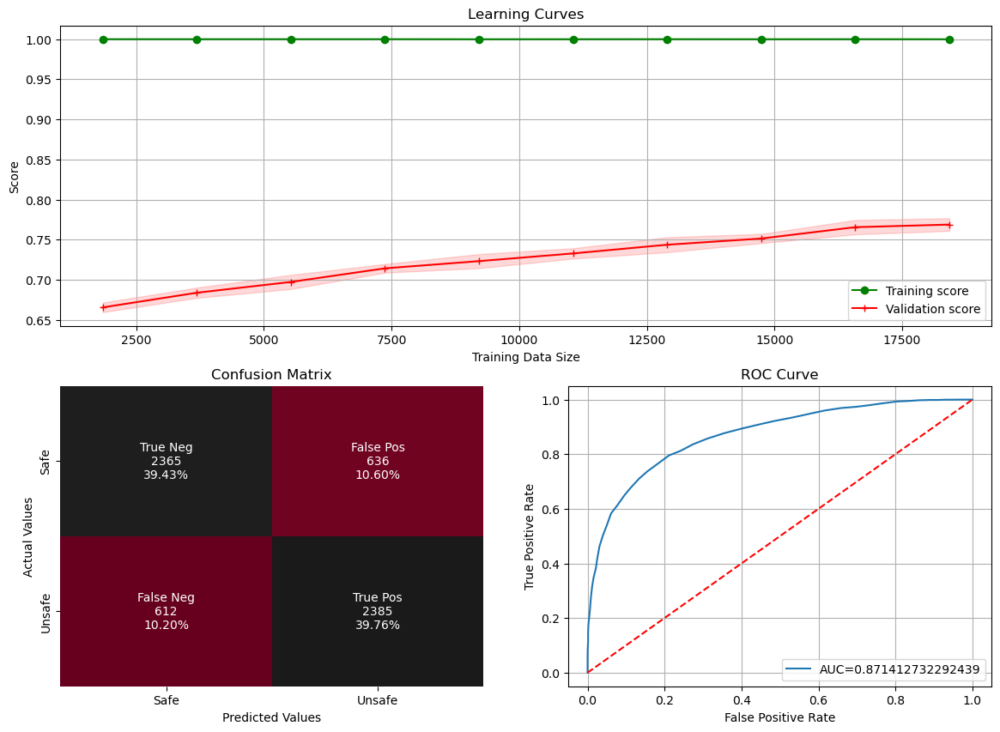

Evaluating Logistic Regression...


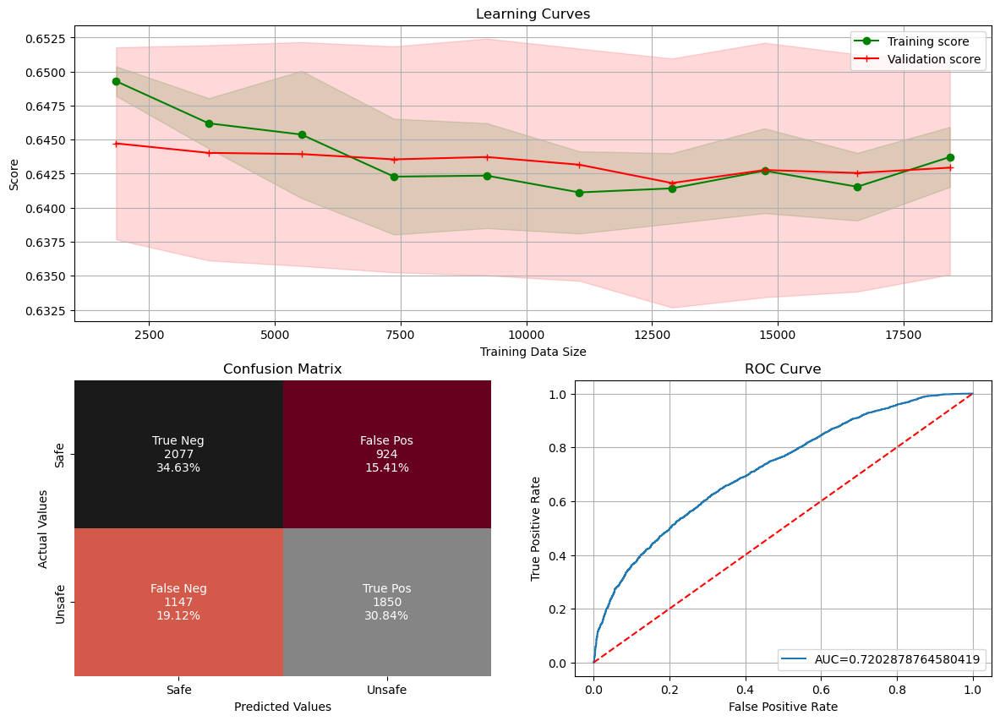

Evaluating Naive Bayes...


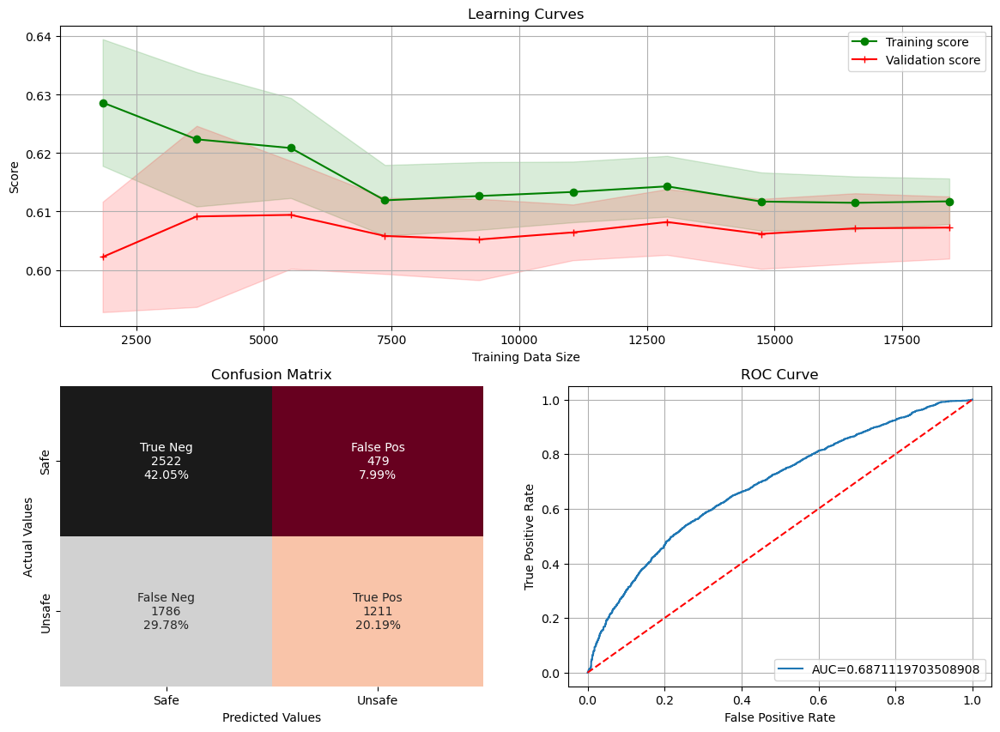

Evaluating Decision Tree...


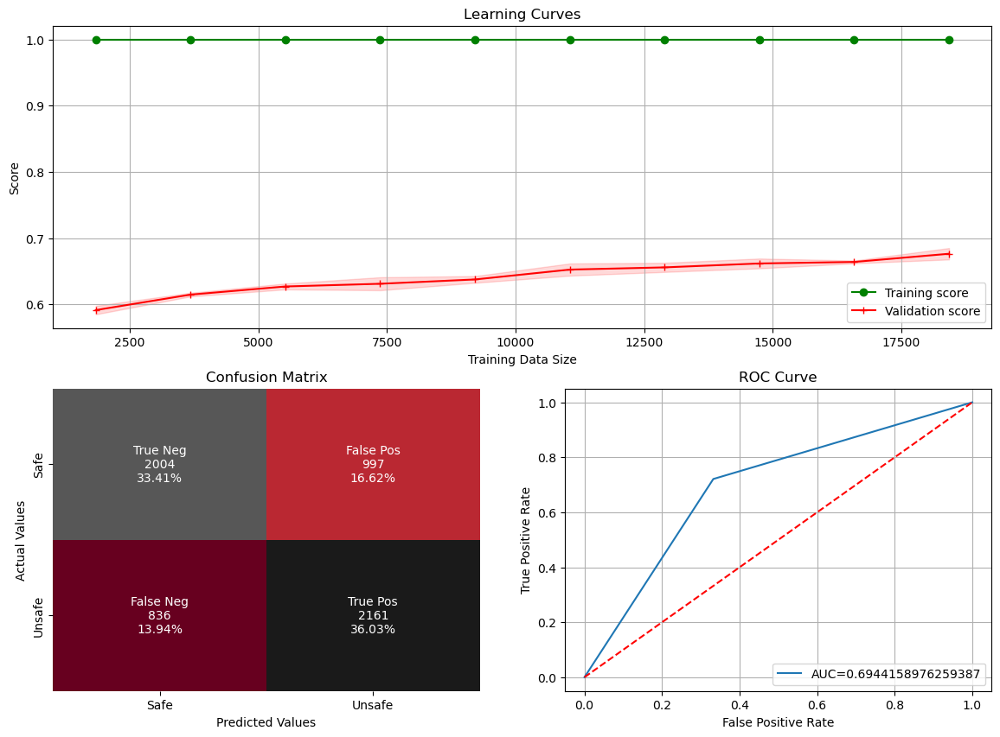

Evaluating Gradient Boosting...


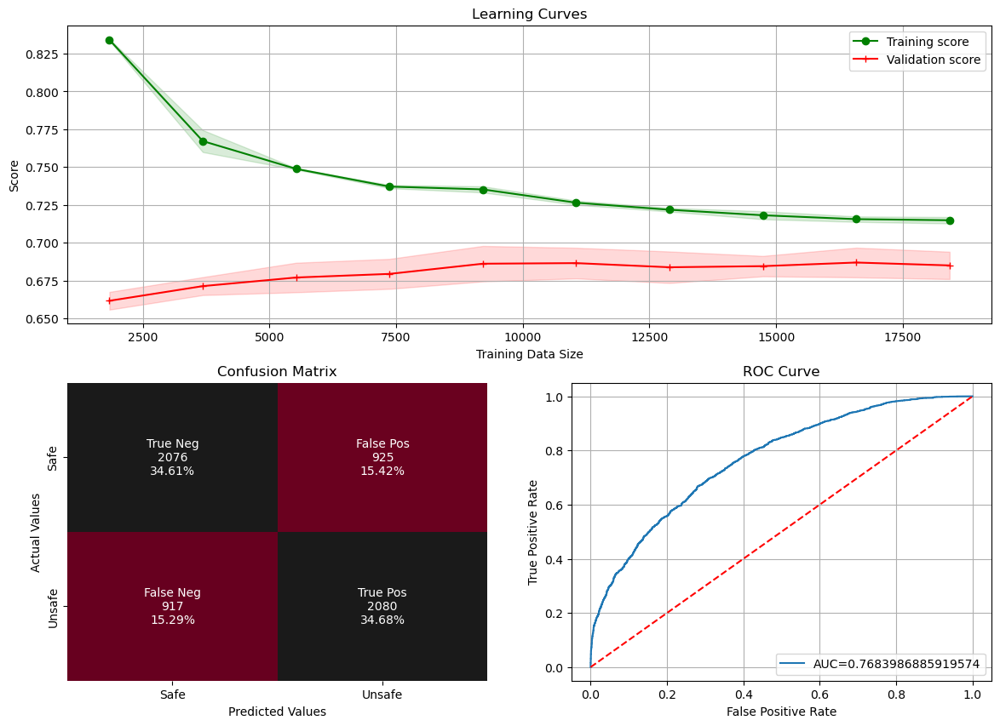

Evaluating XGBoost...


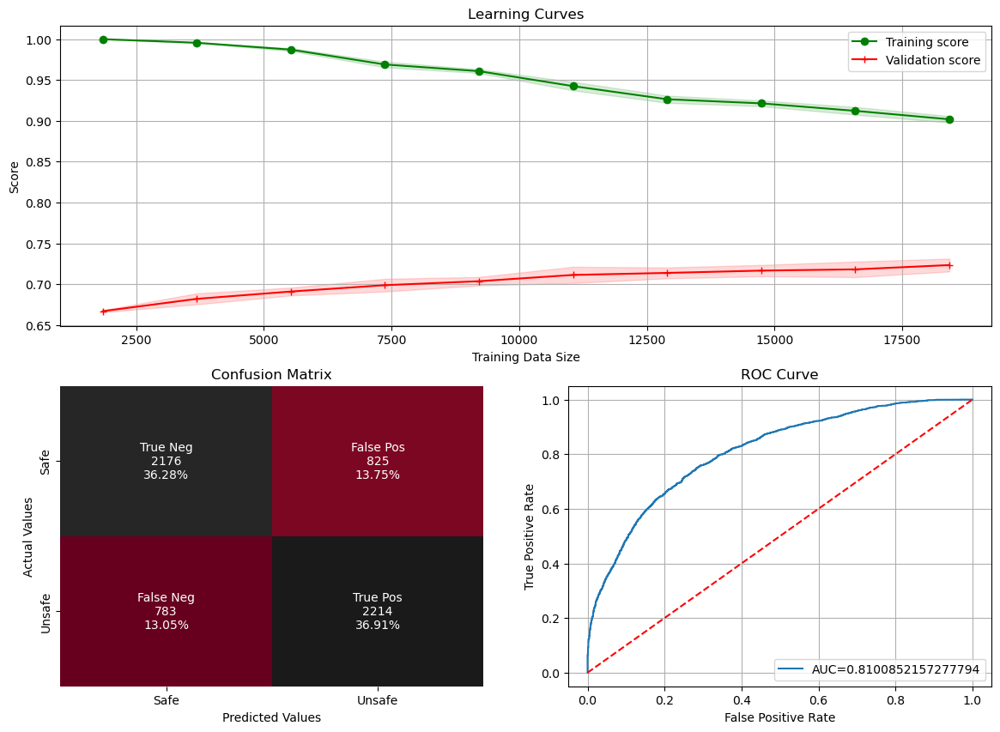

Evaluating Light GBM...
[LightGBM] [Info] Number of positive: 11643, number of negative: 11387
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3825
[LightGBM] [Info] Number of data points in the train set: 23030, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000


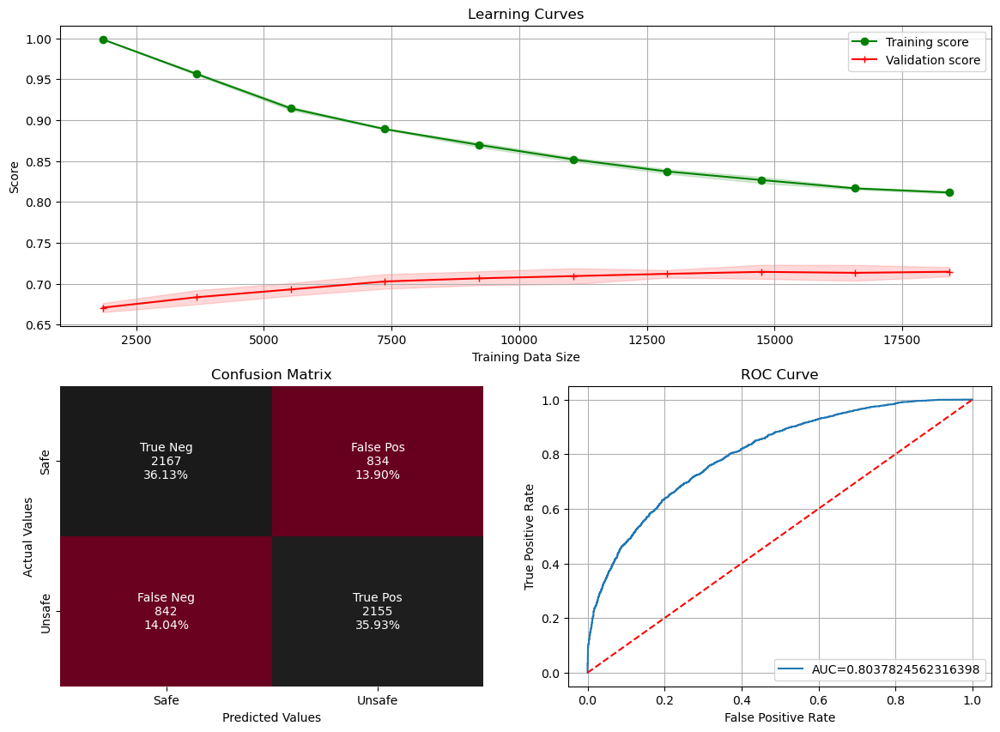

In [22]:
for name, model in models:
    with mlflow.start_run(run_name=name):
        with joblib.parallel_backend('dask'):
            pipeline[model_step] = ("model", model)
            cv_pipeline = Pipeline(steps=pipeline)
            cv_results = cross_validate(cv_pipeline, X_train, y_train, cv=5, scoring=score_metrics, return_train_score=True, n_jobs=-1)

            # Compute the mean of the scores of the 5 cross validation sets
            mean_cv_results = {f"{i} Mean": np.mean(v) for i, v in cv_results.items()}

            # Log Model Details into MLFlow
            mlflow.sklearn.log_model(model, name)

            # Log the parameters of the model into MLFlow
            for i in model.get_params().keys():
                mlflow.log_param(i, model.get_params()[i])

            # Log Metrics into MLFlow
            for i in mean_cv_results.keys():
                mlflow.log_metric(i, mean_cv_results[i])

            # Store the results of the model into a dictionary
            scores_df[name] = mean_cv_results
            evaluate_model(name, model)

**Observations:**
- Visually, it looks like the validation score increased in the learning curve graph as the data size increased for these models (Random Forest, Gradient Boosting, XGBoost, LightGBM).
- Training score for Random Forest is definitely overfitted but the validation score seems that it is learning from the data.
- According to the confusion matrix, Random Forest has the most number of True Positives and True Negatives compared to the False Positives and False Negatives, followed by XGBoost.
- AUC-ROC shows that Random Forest is the best model, followed by XGBoost and LightGBM.

In [23]:
models_scores_df = pd.DataFrame(scores_df).T.sort_values(by=['test_f2 Mean', 'test_recall Mean'], ascending=False)
display(models_scores_df)

,fit_time Mean,score_time Mean,test_f2 Mean,train_f2 Mean,test_recall Mean,train_recall Mean,test_precision Mean,train_precision Mean,test_balanced_accuracy Mean,train_balanced_accuracy Mean,test_roc_auc_score Mean,train_roc_auc_score Mean
Random Forest Classifier,1.586520,0.103582,0.774130,0.999893,0.775403,0.999871,0.769138,0.999979,0.768706,0.999925,0.852295,1.000000
XGBoost,3.648987,0.023998,0.733656,0.911307,0.736666,0.916108,0.721904,0.892605,0.723210,0.901707,0.804450,0.967529
Light GBM,0.675781,0.036997,0.723375,0.816617,0.724470,0.818646,0.719039,0.808623,0.717508,0.810263,0.798078,0.896207
Decision Tree,0.272599,0.009768,0.696307,1.000000,0.702569,1.000000,0.672406,1.000000,0.676259,1.000000,0.676259,1.000000
Gradient Boosting,10.065997,0.018332,0.691660,0.719780,0.692863,0.720497,0.686895,0.716995,0.684975,0.714853,0.762162,0.795499
Logistic Regression,0.078188,0.016398,0.626081,0.626878,0.618914,0.619621,0.656512,0.657693,0.643917,0.644941,0.711668,0.712561
Naive Bayes,0.013000,0.013998,0.430835,0.433855,0.394141,0.396698,0.687801,0.694473,0.605607,0.609113,0.664585,0.667853


**Observations**
- According to the test f2 score and test recall mean, the three best models are Random Forest Classifier, XGBoost and LightGBM.
- Gradient Boosting is not performing as well as it should perform, the mean fit time takes way too long, probably because it is a more complex model than the others, it is also not very worth it as the mean f2 score and the mean recall score are not that high.

### Hyperparameter Tuning
- Using GridSearchCV to tune the hyperparameters of the best few models (i.e. Random Forest, XGBoost, Light GBM & Gradient Boosting)

#### Hyperparameter Tuning for Random Forest Classifier
- `n_estimators`: 
  - Number of trees in forest - Increasing the number of trees may improve model performance, but has a trade-off between computation time and performance
- `criterion`:
  - Measure the quality of a split - {
    - `gini`: Measure the frequency at a randomly chosen element wold be incorrectly labeled, a measure of node impurity
    - `entropy`: Measures the information gain, indicating the order or uncertainty of a node
  }
- `max_features`:
  - Maximum number of features considered for splitting a node - Controlling feature selection helps improve model diversity and generalization
- `min_samples_split`:
  - Minimum number of samples required to split an internal node - Adjusting this parameter can influence the trade-off between overfitting and underfitting
- `min_samples_leaf`:
  - Minimum number of samples required to be at a leaf node - Adjusting this parameter can influence the trade-off between overfitting and underfitting
- `max_depth`:
  - Maximum depth in the individual trees - Controlling the depth helps prevent overfitting (find the right balance between underfitting and overfitting)

In [114]:
# Create the parameter grid
params_grid = {
    "model__n_estimators": [100, 200, 500, 700, 1000, 1500],
    "model__criterion": ['gini', 'log_loss', 'entropy'],
    "model__max_features": ["auto", "sqrt"],
    "model__min_samples_split": np.arange(2, 7, 2),
    "model__min_samples_leaf": np.arange(2, 7, 2),
    "model__max_depth": [np.arange(10, 51, 10), None]
}

In [115]:
pipeline[model_step] = ("model", RandomForestClassifier(random_state=42))
rand_forest_pipeline = Pipeline(steps=[
    ("Standardisation", StandardScaler()),
    ("model", RandomForestClassifier(random_state=42))
])

In [116]:
f2 = make_scorer(fbeta_score, beta =2, needs_proba=False, needs_threshold=False)

tuned_forest = GridSearchCV(rand_forest_pipeline, params_grid, cv=5, scoring=f2, n_jobs=-1, verbose=1, return_train_score=True)
with joblib.parallel_backend('dask'):
    tuned_forest.fit(X_train, y_train, model__sample_weight=y_train.map(weights_dict))

Fitting 5 folds for each of 648 candidates, totalling 3240 fits


In [117]:
print(tuned_forest.best_estimator_)
print(tuned_forest.best_params_)
print(tuned_forest.best_score_)

Pipeline(steps=[('Standardisation', StandardScaler()),
                ('model',
                 RandomForestClassifier(criterion='log_loss',
                                        max_features='auto', min_samples_leaf=2,
                                        n_estimators=700, random_state=42))])
{'model__criterion': 'log_loss', 'model__max_depth': None, 'model__max_features': 'auto', 'model__min_samples_leaf': 2, 'model__min_samples_split': 2, 'model__n_estimators': 700}
0.7937158978291956


**Observations**
- We have managed to improve the test f2 score from 0.774 to 0.794.

#### Evaluation for Random Forest Classifier

In [24]:
random_forest_scores={}

In [25]:
rand_forest_model = [
    ("Random Forest Classifier", RandomForestClassifier(criterion='log_loss',
                                        max_features='auto', min_samples_leaf=2,min_samples_split= 2,
                                        n_estimators=700, random_state=42, max_depth=None))
]

In [27]:
tuned_forest_best_params = {'model__criterion': 'log_loss', 
                            'model__max_depth': None, 
                            'model__max_features': 'auto', 
                            'model__min_samples_leaf': 2, 
                            'model__min_samples_split': 2, 
                            'model__n_estimators': 700
                            }

Evaluating Random Forest Classifier...


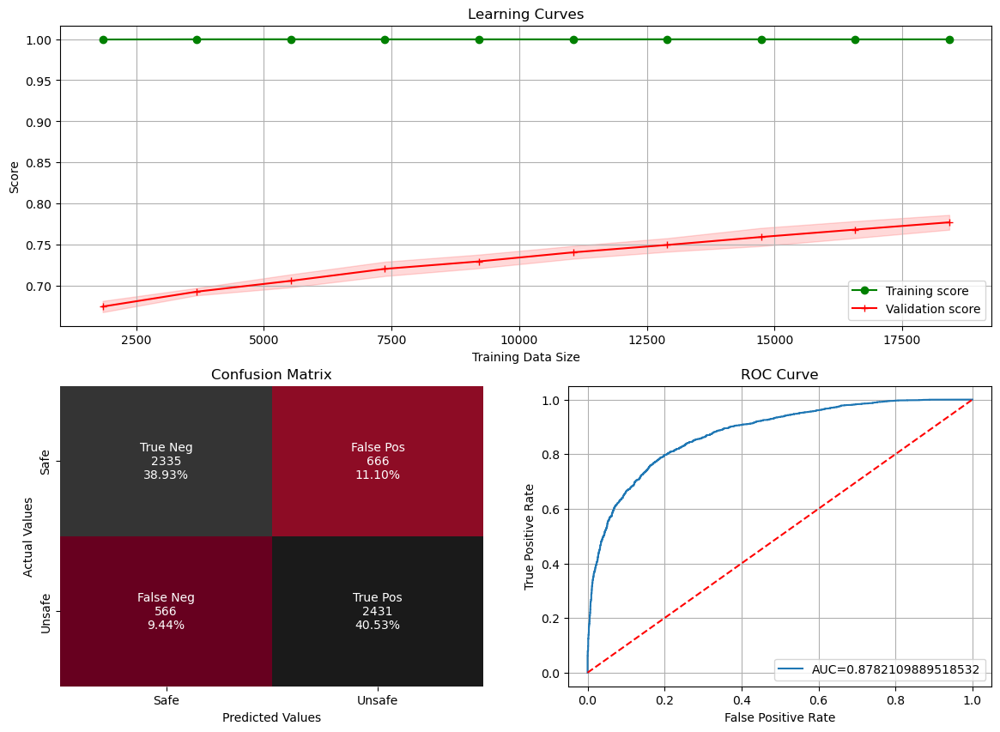

In [28]:
for name, model in rand_forest_model:
    with mlflow.start_run(run_name=name):
        with joblib.parallel_backend('dask'):
            pipeline[model_step] = ("model", model)
            cv_pipeline = Pipeline(steps=pipeline)
            cv_results = cross_validate(cv_pipeline, X_train, y_train, cv=5, scoring=score_metrics, return_train_score=True, n_jobs=-1)

            # Compute the mean of the scores of the 5 cross validation sets
            mean_cv_results = {f"{i} Mean": np.mean(v) for i, v in cv_results.items()}

            # Log Model Details into MLFlow
            mlflow.sklearn.log_model(model, name)

            # Log Metrics into MLFlow
            for i in mean_cv_results.keys():
                mlflow.log_metric(i, mean_cv_results[i])

            # Log the best parameters into MLFlow
            mlflow.log_param("Best Parameters", tuned_forest_best_params)

            # Store the results of the model into a dictionary
            random_forest_scores[name] = mean_cv_results
            evaluate_model(name, model)

**Observations**
- AUC-ROC for the improved Random Forest is quite high.
- In the confusion matrix, the true positive and true negative data are much greater than the false negatives and the false positives in the tuned Random Forest compared to the untuned model.

In [29]:
forest_scores_df = pd.DataFrame(random_forest_scores).T.sort_values(by=['test_f2 Mean', 'test_recall Mean'], ascending=False)
display(forest_scores_df)

,fit_time Mean,score_time Mean,test_balanced_accuracy Mean,test_f2 Mean,test_precision Mean,test_recall Mean,test_roc_auc_score Mean,train_balanced_accuracy Mean,train_f2 Mean,train_precision Mean,train_recall Mean,train_roc_auc_score Mean
Random Forest Classifier,21.909626,0.9413,0.776711,0.7945,0.767643,0.801512,0.860958,0.999738,0.99982,0.999614,0.999871,0.999999


**Observations**
- After improving the parameters, the scores of Random Forest are definitely improved, jumping from 0.774 to 0.794.

#### Hyperparameter Tuning for XGBoost
- `n_estimators`: 
  - Number of boosting rounds or trees - Increasing the number of trees may improve model performance, but has a trade-off between computation time and performance
- `learning_rate`:
  - Step size shrinkage used to prevent overfitting - Increasing the number of trees may improve performance, but there's a trade off with computation time
- `max_depth`:
  - Maximum depth of a tree - Controlling overfitting, smaller values are for more complex datasets
- `subsample`:
  - Fraction of samples used for fitting trees - Adjusting this parameter can control overfitting
- `colsample_bytree`:
  - Specifies the fraction of features to be randomly sampled for building each tree - Control feature sampling during tree construction, introducing additional randomness and help prevent overfitting by introducing diversity among the trees

In [52]:
params_grid = {
    'model__n_estimators': [300, 500, 700, 850, 1000],
    'model__learning_rate': [0.05, 0.1],
    'model__max_depth': [5, 7, 9],
    'model__subsample': [0.7, 0.8, 0.9],
    'model__colsample_bytree': [1.0, 1.2, 1.3],
}

In [53]:
pipeline[model_step] = ("model", XGBClassifier(random_state=42))
xgboost_pipeline = Pipeline(steps=[
    ("Standardisation", StandardScaler()),
    ("model", XGBClassifier(random_state=42))
])

In [54]:
tuned_xgboost = GridSearchCV(xgboost_pipeline, params_grid, cv=5, scoring=f2, n_jobs=-1, verbose=1, return_train_score=True)
with joblib.parallel_backend('dask'):
    tuned_xgboost.fit(X_train, y_train, model__sample_weight=y_train.map(weights_dict))

Fitting 5 folds for each of 270 candidates, totalling 1350 fits


In [55]:
print(tuned_xgboost.best_estimator_)
print(tuned_xgboost.best_params_)
print(tuned_xgboost.best_score_)

Pipeline(steps=[('Standardisation', StandardScaler()),
                ('model',
                 XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
                               colsample_bylevel=1, colsample_bynode=1,
                               colsample_bytree=1.0, early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=0, gpu_id=-1,
                               grow_policy='depthwise', importance_type=None,
                               interaction_constraints='', learning_rate=0.1,
                               max_bin=256, max_cat_threshold=64,
                               max_cat_to_onehot=4, max_delta_step=0,
                               max_depth=9, max_leaves=0, min_child_weight=1,
                               missing=nan, monotone_constraints='()',
                               n_estimators=850, n_jobs=0, num_parallel_tree=1,
                  

**Observations**
- The f2 score improved from 0.73 to 0.796 after tuning.

#### Evaluation for XGBoost

In [66]:
xgboost_scores={}

In [67]:
xgboost_model = [
    ("XGBoost", XGBClassifier(colsample_bytree=1.0, 
                              learning_rate=0.1,
                               max_depth=9,
                               n_estimators=850, 
                               subsample=0.7,
                               random_state=42))
]

In [68]:
tuned_xgboost_best_params = {'model__colsample_bytree': 1.0, 
                             'model__learning_rate': 0.1, 
                             'model__max_depth': 9, 
                             'model__n_estimators': 850, 
                             'model__subsample': 0.7}

Evaluating XGBoost...


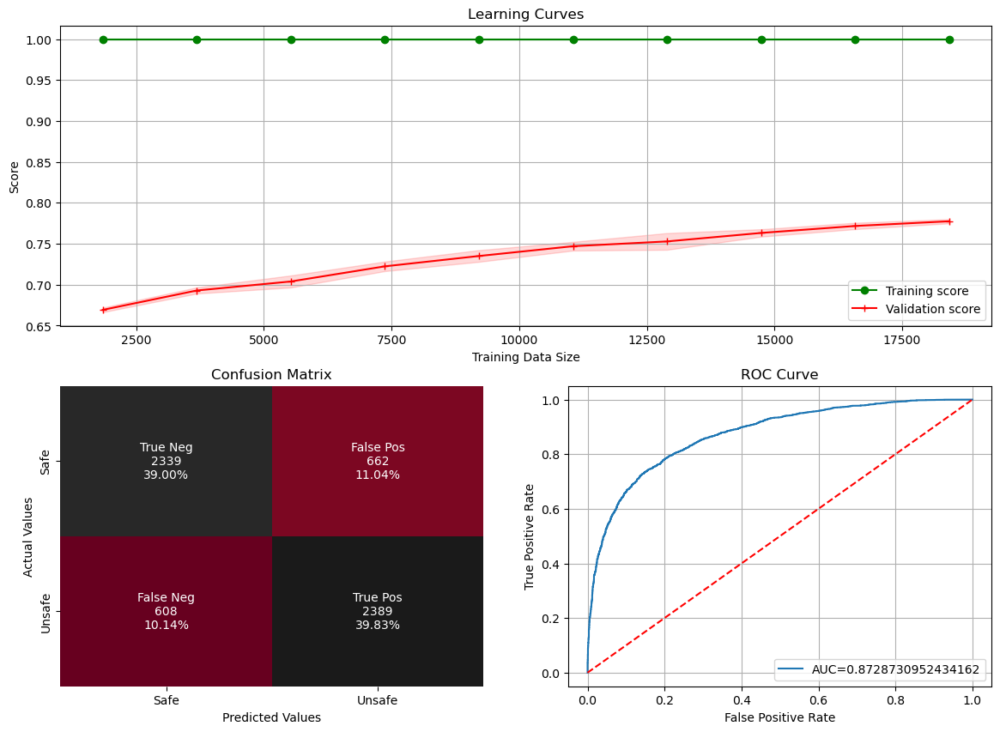

In [69]:
for name, model in xgboost_model:
    with mlflow.start_run(run_name=name):
        with joblib.parallel_backend('dask'):
            pipeline[model_step] = ("model", model)
            cv_pipeline = Pipeline(steps=pipeline)
            cv_results = cross_validate(cv_pipeline, X_train, y_train, cv=5, scoring=score_metrics, return_train_score=True, n_jobs=-1)

            # Compute the mean of the scores of the 5 cross validation sets
            mean_cv_results = {f"{i} Mean": np.mean(v) for i, v in cv_results.items()}

            # Log Model Details into MLFlow
            mlflow.sklearn.log_model(model, name)

            # Log Metrics into MLFlow
            for i in mean_cv_results.keys():
                mlflow.log_metric(i, mean_cv_results[i])

            # Log the best parameters into MLFlow
            mlflow.log_param("Best Parameters", tuned_xgboost_best_params)

            # Store the results of the model into a dictionary
            xgboost_scores[name] = mean_cv_results
            evaluate_model(name, model)

**Observations**
- AUC-ROC for the improved XGBoost is quite high.
- In the confusion matrix, the true positive and true negative data are much greater than the false negatives and the false positives in the tuned XGBoost compared to the untuned model.

In [70]:
xgboost_df = pd.DataFrame(xgboost_scores).T.sort_values(by=['test_f2 Mean', 'test_recall Mean'], ascending=False)
display(xgboost_df)

,fit_time Mean,score_time Mean,test_balanced_accuracy Mean,test_f2 Mean,test_precision Mean,test_recall Mean,test_roc_auc_score Mean,train_balanced_accuracy Mean,train_f2 Mean,train_precision Mean,train_recall Mean,train_roc_auc_score Mean
XGBoost,40.296614,0.192668,0.777869,0.793858,0.77004,0.800052,0.861767,1.0,1.0,1.0,1.0,1.0


**Observations**
- After improving the parameters, the scores of XGBClassifier have definitely improved making it the best model, improving f2 score by 0.01 and recall by 0.07.

#### Hyperparameter Tuning for LightGBM
- `n_estimators`: 
  - Number of boosting rounds or trees - Increasing the number of trees may improve model performance, but has a trade-off between computation time and performance
- `learning_rate`:
  - Step size shrinkage used to prevent overfitting - Increasing the number of trees may improve performance, but there's a trade off with computation time
- `max_depth`:
  - Maximum depth of a tree - Controlling overfitting, smaller values are for more complex datasets
- `subsample`:
  - Fraction of samples used for fitting trees - Adjusting this parameter can control overfitting
- `colsample_bytree`:
  - Specifies the fraction of features to be randomly sampled for building each tree - Control feature sampling during tree construction, introducing additional randomness and help prevent overfitting by introducing diversity among the trees
- `reg_alpha`:
  - L1 regularization term on leaf weight - Help prevent overfitting by penalizing large leaf weights
- `reg_lambda`:
  - L2 regularization term on leaf weight - Help prevent overfitting by penalizing large leaf weights
- `num_leaves`:
  - Maximum number of leaves in a tree - Controls the complexity of individual trees (high values - overfitting, lower values - simpler trees)

In [46]:
params_grid = {
    'model__n_estimators': [100, 300, 500],
    'model__learning_rate': [0.01, 0.1],
    'model__max_depth': [5, 7, 9],
    'model__subsample': [0.7, 0.8, 0.9],
    'model__colsample_bytree': [0.8, 1.0],
    'model__min_child_samples': [5, 10, 20],
    'model__reg_alpha': [0, 1.0],
    'model__reg_lambda': [0, 2.0],
    'model__num_leaves': [31, 63],
}

In [47]:
pipeline[model_step] = ("model", LGBMClassifier(random_state=42))
lgbmboost_pipeline = Pipeline(steps=[
    ("Standardisation", StandardScaler()),
    ("model", LGBMClassifier(random_state=42))
])

In [42]:
import warnings

with warnings.catch_warnings():
    warnings.simplefilter("ignore", category=UserWarning)
    warnings.filterwarnings("ignore", message="No further splits with positive gain, best gain: -inf")

In [49]:
tuned_lgbmboost = GridSearchCV(lgbmboost_pipeline, params_grid, cv=5, scoring=f2, n_jobs=-1, verbose=1, return_train_score=True)
with joblib.parallel_backend('dask'):
    tuned_lgbmboost.fit(X_train, y_train, model__sample_weight=y_train.map(weights_dict))

Fitting 5 folds for each of 2592 candidates, totalling 12960 fits
[LightGBM] [Info] Number of positive: 11642, number of negative: 11388
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001181 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3825
[LightGBM] [Info] Number of data points in the train set: 23030, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

In [50]:
print(tuned_lgbmboost.best_estimator_)
print(tuned_lgbmboost.best_params_)
print(tuned_lgbmboost.best_score_)

Pipeline(steps=[('Standardisation', StandardScaler()),
                ('model',
                 LGBMClassifier(max_depth=9, n_estimators=500, num_leaves=63,
                                random_state=42, reg_alpha=1.0, reg_lambda=0,
                                subsample=0.7))])
{'model__colsample_bytree': 1.0, 'model__learning_rate': 0.1, 'model__max_depth': 9, 'model__min_child_samples': 20, 'model__n_estimators': 500, 'model__num_leaves': 63, 'model__reg_alpha': 1.0, 'model__reg_lambda': 0, 'model__subsample': 0.7}
0.7824598275472532


**Observations**
- The LightGBM f2 score improved from 0.72 to 0.78.

#### Evaluation for LightGBM

In [39]:
lgbmboost_scores={}

In [40]:
lgbmboost_model = [
    ("Lightgbm", LGBMClassifier(max_depth=9, min_child_samples=20,
                                n_estimators=500, num_leaves=63,
                                random_state=42, reg_alpha=1.0, reg_lambda=0,
                                subsample=0.7))
]

In [41]:
tuned_lightgbm_best_params = {'model__colsample_bytree': 1.0, 
                        'model__learning_rate': 0.1, 
                        'model__max_depth': 9, 
                        'model__min_child_samples': 20, 
                        'model__n_estimators': 500, 
                        'model__num_leaves': 63, 
                        'model__reg_alpha': 1.0, 
                        'model__reg_lambda': 0, 
                        'model__subsample': 0.7}

Evaluating Lightgbm...
[LightGBM] [Info] Number of positive: 11643, number of negative: 11387
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3825
[LightGBM] [Info] Number of data points in the train set: 23030, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spl

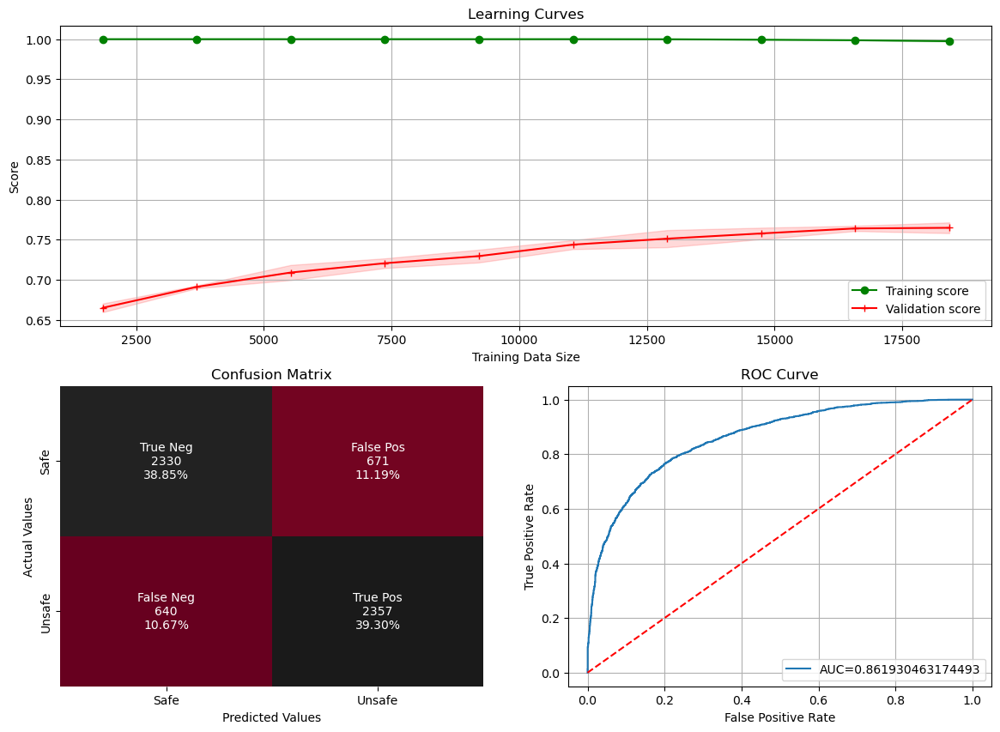

In [43]:
for name, model in lgbmboost_model:
    with mlflow.start_run(run_name=name):
        with joblib.parallel_backend('dask'):
            pipeline[model_step] = ("model", model)
            cv_pipeline = Pipeline(steps=pipeline)
            cv_results = cross_validate(cv_pipeline, X_train, y_train, cv=5, scoring=score_metrics, return_train_score=True, n_jobs=-1)

            # Compute the mean of the scores of the 5 cross validation sets
            mean_cv_results = {f"{i} Mean": np.mean(v) for i, v in cv_results.items()}

            # Log Model Details into MLFlow
            mlflow.sklearn.log_model(model, name)

            # Log Metrics into MLFlow
            for i in mean_cv_results.keys():
                mlflow.log_metric(i, mean_cv_results[i])

            # Log the best parameters into MLFlow
            mlflow.log_param("Best Parameters", tuned_lightgbm_best_params)

            # Store the results of the model into a dictionary
            lgbmboost_scores[name] = mean_cv_results
            evaluate_model(name, model)

**Observations**
- AUC-ROC for the improved LightGBM is quite high.
- In the confusion matrix, the true positive and true negative data are much greater than the false negatives and the false positives in the tuned LightGBM compared to the untuned model.

In [44]:
lightbgm_df = pd.DataFrame(lgbmboost_scores).T.sort_values(by=['test_f2 Mean', 'test_recall Mean'], ascending=False)
display(lightbgm_df)

,fit_time Mean,score_time Mean,test_balanced_accuracy Mean,test_f2 Mean,test_precision Mean,test_recall Mean,test_roc_auc_score Mean,train_balanced_accuracy Mean,train_f2 Mean,train_precision Mean,train_recall Mean,train_roc_auc_score Mean
Lightgbm,4.488221,0.056599,0.768622,0.784563,0.761356,0.790604,0.849224,0.997366,0.998348,0.995869,0.998969,0.999957


**Observations**
- After improving the parameters, the test_f2 of LightGBM are definitely improved from 0.723 to 0.78 and test_recall improved from 0.724 to 0.79.

#### Hyperparameter Tuning for Gradient Boosting
- `n_estimators`: 
  - Number of boosting rounds or trees - Increasing the number of trees may improve model performance, but has a trade-off between computation time and performance
- `learning_rate`:
  - Step size shrinkage used to prevent overfitting - Increasing the number of trees may improve performance, but there's a trade off with computation time
- `max_depth`:
  - Maximum depth of a tree - Controlling overfitting, smaller values are for more complex datasets
- `subsample`:
  - Fraction of samples used for fitting trees - Adjusting this parameter can control overfitting
- `min_samples_split`:
  - Minimum number of samples required to split an internal node - Adjusting this parameter can influence the trade-off between overfitting and underfitting
- `min_samples_leaf`:
  - Minimum number of samples required to be at a leaf node - Adjusting this parameter can influence the trade-off between overfitting and underfitting
- `max_features`:
  - Maximum number of features considered for splitting a node - Controlling feature selection helps improve model diversity and generalization

In [56]:
params_grid = {
    'model__n_estimators': [700, 900, 1000, 1150],
    'model__learning_rate': [0.01, 0.1],
    'model__max_depth': [5, 7, 9],
    'model__subsample': [1.0, 1.2],
    'model__min_samples_split': [5, 10],
    'model__min_samples_leaf': [4, 8],
    'model__max_features': ['sqrt', 'log2', None],
}

In [57]:
pipeline[model_step] = ("model", GradientBoostingClassifier(random_state=42))
gradientboost_pipeline = Pipeline(steps=[
    ("Standardisation", StandardScaler()),
    ("model", GradientBoostingClassifier(random_state=42))
])

In [58]:
tuned_gradientboost = GridSearchCV(gradientboost_pipeline, params_grid, cv=5, scoring=f2, n_jobs=-1, verbose=1, return_train_score=True)
with joblib.parallel_backend('dask'):
    tuned_gradientboost.fit(X_train, y_train, model__sample_weight=y_train.map(weights_dict))

Fitting 5 folds for each of 576 candidates, totalling 2880 fits


In [59]:
print(tuned_gradientboost.best_estimator_)
print(tuned_gradientboost.best_params_)
print(tuned_gradientboost.best_score_)

Pipeline(steps=[('Standardisation', StandardScaler()),
                ('model',
                 GradientBoostingClassifier(max_depth=9, max_features='sqrt',
                                            min_samples_leaf=8,
                                            min_samples_split=5,
                                            n_estimators=1150,
                                            random_state=42))])
{'model__learning_rate': 0.1, 'model__max_depth': 9, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 8, 'model__min_samples_split': 5, 'model__n_estimators': 1150, 'model__subsample': 1.0}
0.7998945917693134


**Observations**
- After improvement, test_f2 for Gradient Boosting improved from 0.69 to 0.799.

#### Evaluation for Gradient Boosting

In [61]:
gradientboost_scores={}

In [62]:
gradientboost_model = [
    ("GradientBoosting", GradientBoostingClassifier(max_depth=9, max_features='sqrt',
                                            min_samples_leaf=8, learning_rate = 0.1,
                                            min_samples_split=5,
                                            n_estimators=1150, subsample=1.0,
                                            random_state=42))
]

In [63]:
tuned_gb_best_params = {'model__learning_rate': 0.1, 
                        'model__max_depth': 9, 
                        'model__max_features': 'sqrt', 
                        'model__min_samples_leaf': 8, 
                        'model__min_samples_split': 5, 
                        'model__n_estimators': 1150, 
                        'model__subsample': 1.0}

Evaluating GradientBoosting...


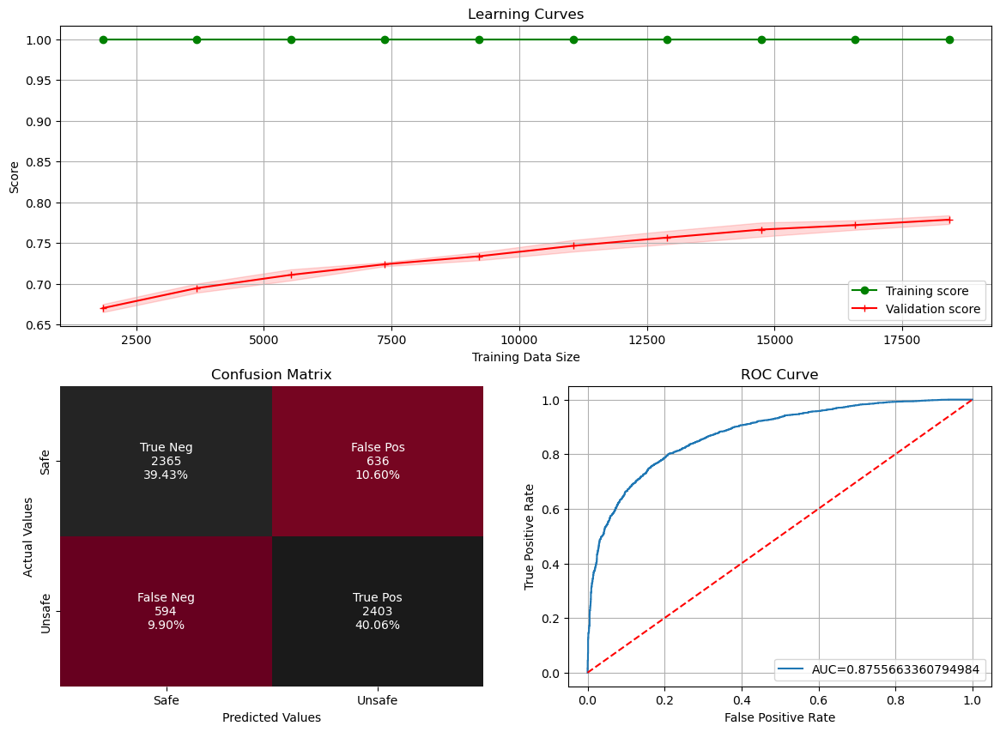

In [64]:
for name, model in gradientboost_model:
    with mlflow.start_run(run_name=name):
        with joblib.parallel_backend('dask'):
            pipeline[model_step] = ("model", model)
            cv_pipeline = Pipeline(steps=pipeline)
            cv_results = cross_validate(cv_pipeline, X_train, y_train, cv=5, scoring=score_metrics, return_train_score=True, n_jobs=-1)

            # Compute the mean of the scores of the 5 cross validation sets
            mean_cv_results = {f"{i} Mean": np.mean(v) for i, v in cv_results.items()}

            # Log Model Details into MLFlow
            mlflow.sklearn.log_model(model, name)

            # Log Metrics into MLFlow
            for i in mean_cv_results.keys():
                mlflow.log_metric(i, mean_cv_results[i])

            # Log the best parameters into MLFlow
            mlflow.log_param("Best Parameters", tuned_gb_best_params)

            # Store the results of the model into a dictionary
            gradientboost_scores[name] = mean_cv_results
            evaluate_model(name, model)

**Observations**
- After improvement, the tuned Gradient Boosting scored to be much better than the untuned model.
- AUC-ROC for the improved Gradient Boosting is quite high.
- In the confusion matrix, the true positive and true negative data are much greater than the false negatives and the false positives in the tuned Gradient Boosting compared to the untuned model.

In [65]:
gradientboost_df = pd.DataFrame(gradientboost_scores).T.sort_values(by=['test_f2 Mean', 'test_recall Mean'], ascending=False)
display(gradientboost_df)

,fit_time Mean,score_time Mean,test_balanced_accuracy Mean,test_f2 Mean,test_precision Mean,test_recall Mean,test_roc_auc_score Mean,train_balanced_accuracy Mean,train_f2 Mean,train_precision Mean,train_recall Mean,train_roc_auc_score Mean
GradientBoosting,71.721174,0.340433,0.781069,0.79782,0.772444,0.804433,0.864427,1.0,1.0,1.0,1.0,1.0


**Observations**
- After improving the parameters, the test_f2 score of Gradient Boosting is the most improved from 0.69 to 0.798 and the test_recall improved from 0.69 and 0.80.

### Final Model Selection

Finally, out of all the hypertuned models, we will need to select the best model. These are the differences between the score metrics of the models.

1. `Mean_fit_time` - For mean fit time, RandomForestClassifier took 21.9, XGBoost took 33.6, LightGBM took 4.49, GradientBoosting took 65.0. This implies that LightGBM is the most lightweight model with the fastest training time, followed by XGBoost, RandomForest and GradientBoosting is the most heavyweight model with the longest training time.
2. `Mean_score_time` - For mean score time, RandomForestClassifier took 0.941, XGBoost took 0.161, LightGBM took 0.057, GradientBoosting took 0.271. This implies that LightGBM is the most lightweight model with the fastest scoring time, followed by XGBoost, GradientBoosting and Random Forest is the most heavyweight model with the longest scoring time.
3. `Mean_test_f2` - For mean test f2 score, RandomForestClassifier took 0.794, XGBoost took 0.791, LightGBM took 0.785, GradientBoosting took 0.796. This implies that GradientBoosting is the most robust model to predict if a trip was safe or dangerous, followed by RandomForestClassifier, XGBoost and LightGBM.
4. `Mean test_recall` - For mean test recall score, RandomForestClassifier took 0.801, XGBoost took 0.798, LightGBM took 0.791, GradientBoosting took 0.803. This implies that GradientBoosting is the best model to correctly identify most of the dangerous trips, minimizing the risk of overlooking safety concerns.

In [71]:
# Display the results of the models
display(forest_scores_df)
display(xgboost_df)
display(lightbgm_df)
display(gradientboost_df)

,fit_time Mean,score_time Mean,test_balanced_accuracy Mean,test_f2 Mean,test_precision Mean,test_recall Mean,test_roc_auc_score Mean,train_balanced_accuracy Mean,train_f2 Mean,train_precision Mean,train_recall Mean,train_roc_auc_score Mean
Random Forest Classifier,21.909626,0.9413,0.776711,0.7945,0.767643,0.801512,0.860958,0.999738,0.99982,0.999614,0.999871,0.999999


,fit_time Mean,score_time Mean,test_balanced_accuracy Mean,test_f2 Mean,test_precision Mean,test_recall Mean,test_roc_auc_score Mean,train_balanced_accuracy Mean,train_f2 Mean,train_precision Mean,train_recall Mean,train_roc_auc_score Mean
XGBoost,40.296614,0.192668,0.777869,0.793858,0.77004,0.800052,0.861767,1.0,1.0,1.0,1.0,1.0


,fit_time Mean,score_time Mean,test_balanced_accuracy Mean,test_f2 Mean,test_precision Mean,test_recall Mean,test_roc_auc_score Mean,train_balanced_accuracy Mean,train_f2 Mean,train_precision Mean,train_recall Mean,train_roc_auc_score Mean
Lightgbm,4.488221,0.056599,0.768622,0.784563,0.761356,0.790604,0.849224,0.997366,0.998348,0.995869,0.998969,0.999957


,fit_time Mean,score_time Mean,test_balanced_accuracy Mean,test_f2 Mean,test_precision Mean,test_recall Mean,test_roc_auc_score Mean,train_balanced_accuracy Mean,train_f2 Mean,train_precision Mean,train_recall Mean,train_roc_auc_score Mean
GradientBoosting,71.721174,0.340433,0.781069,0.79782,0.772444,0.804433,0.864427,1.0,1.0,1.0,1.0,1.0


**Observations**
- The main metric used to select the best model is the test_f2_score. 
- Another scoring metric used will be test_recall as we want to identify most of the dangerous trips, minimizing the risk of overlooking safety concerns. 
- One other key important metric to be used is the mean score_time as we need to consider the model performance when deploying it on a GUI.
- If the model scoring time takes too long, the system will take too much time processing and predicting the data.
- As such, RandomForestClassifier should not be chosen as the score time is way too long.
- Therefore, based on f2 score and recall, Gradient Boosting is the best model.

#### Model Export
We will export the tuned model using pickle so we can deploy the model for the GUI development.

In [72]:
# Train final model on X and y
tuned_gb_model = tuned_gradientboost.best_estimator_.fit(X_train, y_train, model__sample_weight=y_train.map(weights_dict))

In [73]:
# Train final model on X and y
tuned_xg_boost = tuned_xgboost.best_estimator_.fit(X_train, y_train, model__sample_weight=y_train.map(weights_dict))

In [74]:
# Export the final model
pickle.dump(tuned_gb_model, open("tuned_gb_model.pkl", "wb"))

In [75]:
# Export the final model
pickle.dump(tuned_xg_boost, open("tuned_xg_boost.pkl", "wb"))

#### Test the Exported Models

In [76]:
# Load the final model
tuned_gb_model = pickle.load(open("tuned_gb_model.pkl", "rb"))

# Predict the test set
y_pred = tuned_gb_model.predict(X_test)

# Print the classification report
print(classification_report(y_test, y_pred, target_names=["Unsafe", "Safe"]))

              precision    recall  f1-score   support

      Unsafe       0.80      0.79      0.79      3001
        Safe       0.79      0.80      0.80      2997

    accuracy                           0.79      5998
   macro avg       0.79      0.79      0.79      5998
weighted avg       0.79      0.79      0.79      5998



In [77]:
# Load the final model
tuned_xg_boost = pickle.load(open("tuned_xg_boost.pkl", "rb"))

# Predict the test set
y_pred = tuned_xg_boost.predict(X_test)

# Print the classification report
print(classification_report(y_test, y_pred, target_names=["Unsafe", "Safe"]))

              precision    recall  f1-score   support

      Unsafe       0.79      0.78      0.79      3001
        Safe       0.78      0.80      0.79      2997

    accuracy                           0.79      5998
   macro avg       0.79      0.79      0.79      5998
weighted avg       0.79      0.79      0.79      5998

